### Importing the basic Libraries

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

pd.set_option('display.max_columns', None)
sns.set()

### Importing the dataset for the predection

In [4]:
df = pd.read_csv("churn.csv")

### Finding the Basic Data Information
- It has 2666 Rows and 20 Columns
- There are 3 Categorical Columns (State, International plan, Voice mail plan)
- There are 16 Numerical Columns
- Target Column is Churn Which is a Binary Classification Problem
- There are no any null Value and duplicate value

In [6]:
df.shape

(3333, 20)

In [7]:
df.sample(10)

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
204,IN,51,510,No,No,0,214.8,94,36.52,149.7,58,12.72,283.4,66,12.75,10.2,5,2.75,0,False
2592,SD,34,408,No,No,0,180.6,65,30.70,280.4,99,23.83,292.4,105,13.16,5.0,3,1.35,1,False
1485,WV,67,510,No,No,0,152.5,131,25.93,252.4,107,21.45,185.4,104,8.34,4.9,3,1.32,2,False
424,ID,46,415,No,No,0,124.8,133,21.22,157.3,143,13.37,199.3,72,8.97,8.6,4,2.32,2,False
1549,NC,124,415,No,No,0,188.5,77,32.05,182.0,123,15.47,218.2,127,9.82,6.1,6,1.65,1,False
2070,MN,152,415,No,No,0,317.8,60,54.03,152.9,100,13.00,123.4,63,5.55,10.4,7,2.81,1,True
270,MT,66,510,No,No,0,201.3,95,34.22,152.8,66,12.99,233.2,101,10.49,7.5,4,2.03,1,False
773,GA,93,408,No,Yes,21,134.2,105,22.81,162.5,128,13.81,186.6,90,8.40,11.8,2,3.19,4,True
1335,TN,47,415,No,Yes,30,196.6,93,33.42,241.4,140,20.52,226.0,118,10.17,12.9,4,3.48,2,False
2278,MS,123,415,Yes,No,0,125.5,106,21.34,128.9,96,10.96,251.9,129,11.34,6.3,6,1.70,4,True


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   3333 non-null   object 
 1   Account length          3333 non-null   int64  
 2   Area code               3333 non-null   int64  
 3   International plan      3333 non-null   object 
 4   Voice mail plan         3333 non-null   object 
 5   Number vmail messages   3333 non-null   int64  
 6   Total day minutes       3333 non-null   float64
 7   Total day calls         3333 non-null   int64  
 8   Total day charge        3333 non-null   float64
 9   Total eve minutes       3333 non-null   float64
 10  Total eve calls         3333 non-null   int64  
 11  Total eve charge        3333 non-null   float64
 12  Total night minutes     3333 non-null   float64
 13  Total night calls       3333 non-null   int64  
 14  Total night charge      3333 non-null   

In [9]:
df.isnull().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

In [10]:
df.duplicated().sum()

0

In [11]:
df.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [12]:
df.describe(include="all")

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
count,3333,3333.000000,3333.000000,3333,3333,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333
unique,51,NaN,NaN,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,WV,NaN,NaN,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
freq,106,NaN,NaN,3010,2411,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2850
mean,NaN,101.064806,437.182418,NaN,NaN,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856,NaN
std,NaN,39.822106,42.371290,NaN,NaN,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491,NaN
min,NaN,1.000000,408.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000,NaN
25%,NaN,74.000000,408.000000,NaN,NaN,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000,NaN
50%,NaN,101.000000,415.000000,NaN,NaN,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000,NaN
75%,NaN,127.000000,510.000000,NaN,NaN,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000,NaN


In [13]:
df.corr(numeric_only=True)['Churn']

Account length            0.016541
Area code                 0.006174
Number vmail messages    -0.089728
Total day minutes         0.205151
Total day calls           0.018459
Total day charge          0.205151
Total eve minutes         0.092796
Total eve calls           0.009233
Total eve charge          0.092786
Total night minutes       0.035493
Total night calls         0.006141
Total night charge        0.035496
Total intl minutes        0.068239
Total intl calls         -0.052844
Total intl charge         0.068259
Customer service calls    0.208750
Churn                     1.000000
Name: Churn, dtype: float64

### Categorical Columns EDA
- Churn --> Is the Target Column. It is the boolean data
- State --> There are 51 Unique Value as there is no impact in the Churn Rate so we ignore this column
- International Plan --> Those who have International Plan are more likly to leave the service. We nee to Label Encode this Column as well
- Voice Mail Plan --> Voice mail Plan has no impact on the Churn Rate so we will ignore this column (Keep after lookin Number Vmail Message)

### Churn
- Mostly data arroung 85% are of False Might be the case of imbalance dataset

In [16]:
df["Churn"].value_counts()

Churn
False    2850
True      483
Name: count, dtype: int64

<Axes: ylabel='count'>

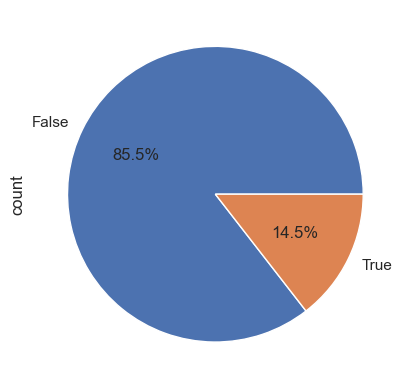

In [17]:
df['Churn'].value_counts().plot(kind='pie',autopct='%0.1f%%')

### State
- There are 51 unique States
- As per the count and cross tab we are sure if there are any particular churn based on any state as churn rate is less than 30% in any state.
- We Ignore the Categorical Column State.

In [19]:
df.State.unique()

array(['KS', 'OH', 'NJ', 'OK', 'AL', 'MA', 'MO', 'WV', 'RI', 'IA', 'MT',
       'ID', 'VT', 'VA', 'TX', 'FL', 'CO', 'AZ', 'NE', 'WY', 'IL', 'NH',
       'LA', 'GA', 'AK', 'MD', 'AR', 'WI', 'OR', 'DE', 'IN', 'UT', 'CA',
       'SD', 'NC', 'WA', 'MN', 'NM', 'NV', 'DC', 'NY', 'KY', 'ME', 'MS',
       'MI', 'SC', 'TN', 'PA', 'HI', 'ND', 'CT'], dtype=object)

In [20]:
len(df.State.unique())

51

In [21]:
df.State.value_counts()

State
WV    106
MN     84
NY     83
AL     80
OR     78
WI     78
OH     78
WY     77
VA     77
CT     74
MI     73
ID     73
VT     73
UT     72
TX     72
IN     71
KS     70
MD     70
MT     68
NJ     68
NC     68
CO     66
NV     66
WA     66
MA     65
RI     65
MS     65
AZ     64
MO     63
FL     63
ND     62
NM     62
ME     62
NE     61
DE     61
OK     61
SD     60
SC     60
KY     59
IL     58
NH     56
AR     55
GA     54
DC     54
TN     53
HI     53
AK     52
LA     51
PA     45
IA     44
CA     34
Name: count, dtype: int64

In [22]:
df["State"].groupby(df["Churn"]).value_counts()

Churn  State
False  WV       96
       AL       72
       VA       72
       WI       71
       MN       69
                ..
True   LA        4
       AZ        4
       HI        3
       IA        3
       AK        3
Name: count, Length: 102, dtype: int64

In [23]:
pd.crosstab(df['Churn'],df['State'],normalize='columns')*100

State,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,GA,HI,IA,ID,IL,IN,KS,KY,LA,MA,MD,ME,MI,MN,MO,MS,MT,NC,ND,NE,NH,NJ,NM,NV,NY,OH,OK,OR,PA,RI,SC,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
Churn,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
False,94.230769,90.0,80.0,93.75,73.529412,86.363636,83.783784,90.740741,85.245902,87.301587,85.185185,94.339623,93.181818,87.671233,91.37931,87.323944,81.428571,86.440678,92.156863,83.076923,75.714286,79.032258,78.082192,82.142857,88.888889,78.461538,79.411765,83.823529,90.322581,91.803279,83.928571,73.529412,90.322581,78.787879,81.927711,87.179487,85.245902,85.897436,82.222222,90.769231,76.666667,86.666667,90.566038,75.0,86.111111,93.506494,89.041096,78.787879,91.025641,90.566038,88.311688
True,5.769231,10.0,20.0,6.25,26.470588,13.636364,16.216216,9.259259,14.754098,12.698413,14.814815,5.660377,6.818182,12.328767,8.62069,12.676056,18.571429,13.559322,7.843137,16.923077,24.285714,20.967742,21.917808,17.857143,11.111111,21.538462,20.588235,16.176471,9.677419,8.196721,16.071429,26.470588,9.677419,21.212121,18.072289,12.820513,14.754098,14.102564,17.777778,9.230769,23.333333,13.333333,9.433962,25.0,13.888889,6.493506,10.958904,21.212121,8.974359,9.433962,11.688312


<Axes: xlabel='State'>

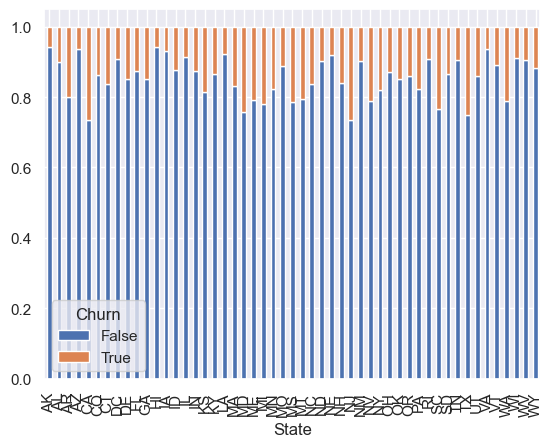

In [24]:
pd.crosstab(df['State'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

### International plan
- There are Either Yes or No Values
- As per the data those who have the international plan is more likely to Exit the Service

In [26]:
df["International plan"].unique()

array(['No', 'Yes'], dtype=object)

In [27]:
df["International plan"].value_counts()

International plan
No     3010
Yes     323
Name: count, dtype: int64

<Axes: ylabel='count'>

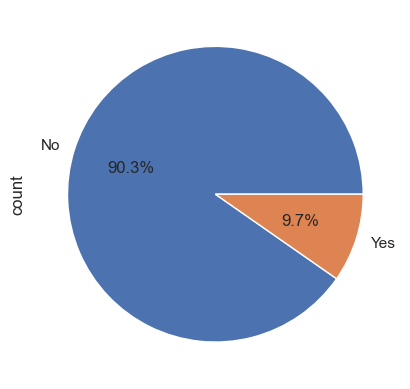

In [28]:
df['International plan'].value_counts().plot(kind='pie',autopct='%0.1f%%')

In [29]:
pd.crosstab(df['Churn'],df['International plan'],normalize='columns')*100

International plan,No,Yes
Churn,,
False,88.504983,57.585139
True,11.495017,42.414861


<Axes: xlabel='International plan'>

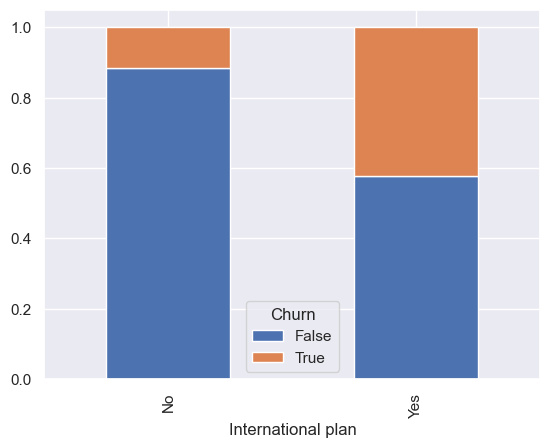

In [30]:
pd.crosstab(df['International plan'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

### Voice mail plan
- There are Either Yes or No Values
- As per the data there is no any impact on the Churn Rate for with context to voice mail so we will ignore this column as well
- We planned to ignore but after looking at the Number of Vmail message Column we conclude to ignore that column and keep this column

In [32]:
df["Voice mail plan"].unique()

array(['Yes', 'No'], dtype=object)

In [33]:
df["Voice mail plan"].value_counts()

Voice mail plan
No     2411
Yes     922
Name: count, dtype: int64

<Axes: ylabel='count'>

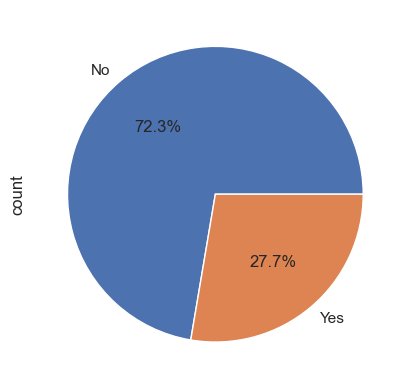

In [34]:
df['Voice mail plan'].value_counts().plot(kind='pie',autopct='%0.1f%%')

In [35]:
pd.crosstab(df['Churn'],df['Voice mail plan'],normalize='columns')*100

Voice mail plan,No,Yes
Churn,,
False,83.284944,91.32321
True,16.715056,8.67679


<Axes: xlabel='Voice mail plan'>

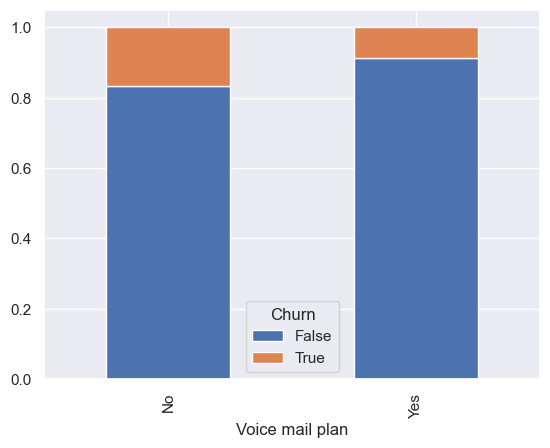

In [36]:
pd.crosstab(df['Voice mail plan'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

### Numerical Column
- Account Length --> Uniform distribution having no impact on target column or any other columns So we ignore
- Area code  --> 3 Unique Code baving no impact on target column or any other columns So we ignore
- Number vmail messages --> As It is related to Voice Mail Plan we will ignore this column and keep the Voice Mail Plan Column, After Pairplot of new_df
- Total day minutes  --> High Correlation with Total day charge so we can ignore either column. More Day Minutes are more likly to exit
- Total day calls --> As There is equal probality of leaving the service on context of day calls so we ignore this feature
- Total day charge  --> Positively correlated with total day minutes so as per the corelation with the target column we ignore this column
- Total eve minutes --> High Correlation with Total eve charge so we can ignore either column. More Eve Minutes are shighly more likly to exit
- Total eve calls -->  As there is equal probalitly so we ignore this column
- 
Total eve charg --> Positively correlated with total eve minutes so as per the corelation with the target column we ignore this column
- 9
Total night minu --> Not any clear reason but yet we decide to keep this feature
- 94
Total night ca--> As there is equal probalitly so we ignore this column
- 007
Total night c --> Positively correlated with Total night minutes so we decide to ignore this column
- 8999
Total intl m --> Thoes who have internation plan and high intl minutes are more likely to exit
- 11369
Total intl--> As there is equal probalitly so we ignore this column
- 017627
Total intl--> Positively correlated with Total intl minutes so we decide to ignore this column
- .011383
Customer serv --> With more than 4 Service call are more likely to exit the serviceice calls

In [38]:
col_to_drop = ["State",
               "Account length",
               "Account size",
               "Area code",
               "Total day calls",
               "Day calls",
               "Total day charge",
               "Eve minutes",
               "Total eve calls",
               "Eve calls",
               "Total eve charge",
               "Night minutes",
               "Total night calls",
               "Night calls",
               "Total night charge",
               "Total intl calls",
               "Intl calls",
               "Total intl charge",
               "Cust calls"
              ]

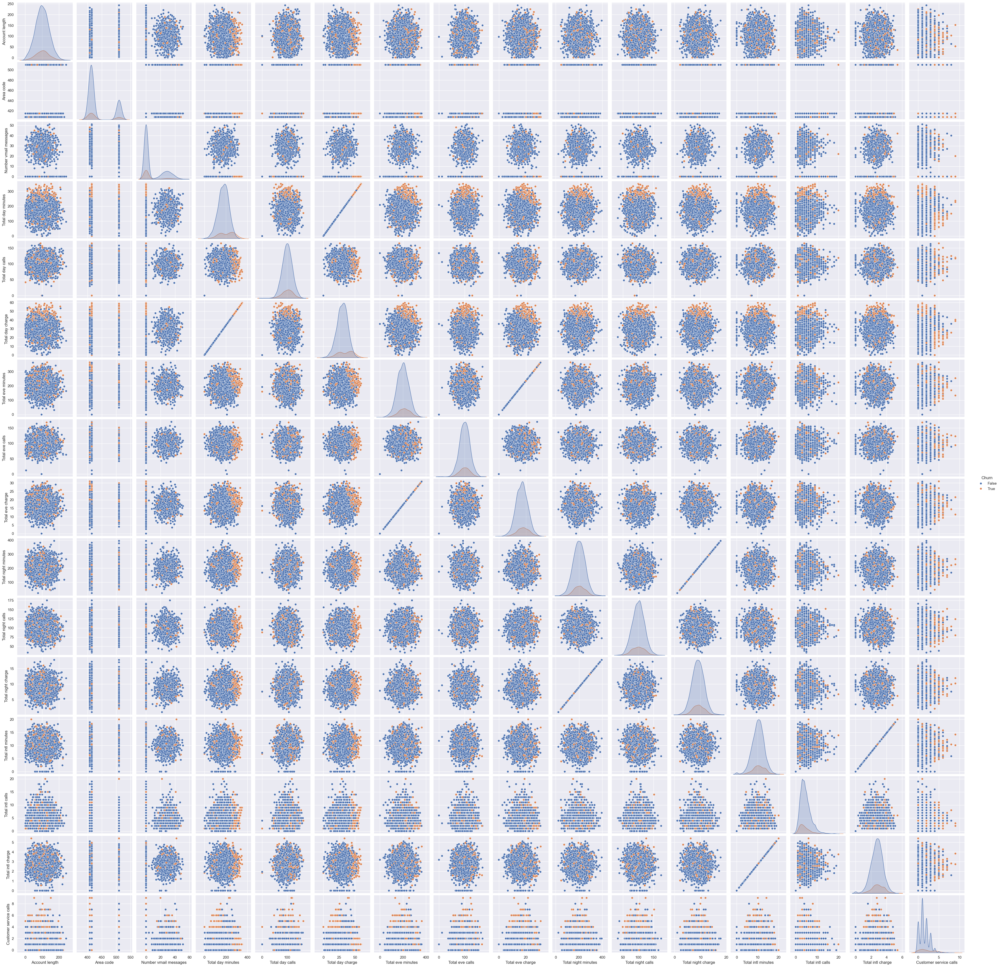

In [39]:
sns.pairplot(df,hue='Churn')

<Axes: >

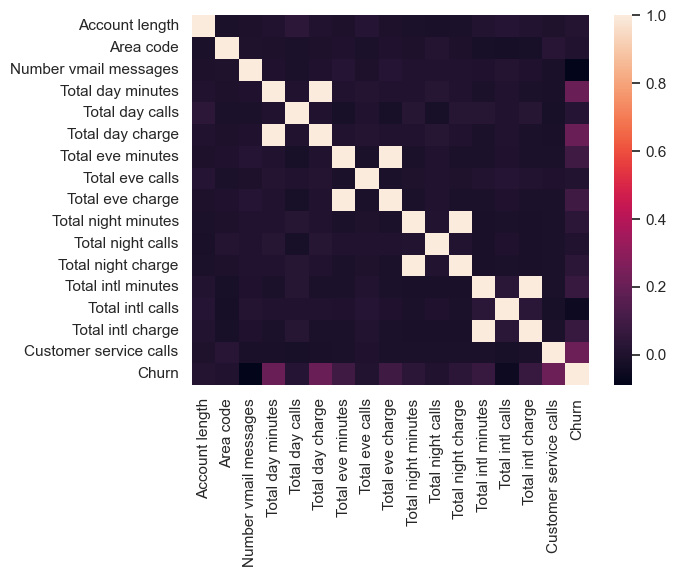

In [40]:
sns.heatmap(df.corr(numeric_only = True))

### Defining a Function to find the correalation

In [42]:
num_df = df.drop(['State','International plan','Voice mail plan'],axis=1) # Defining the Numerical Column
def corr_value(col_to_rel):
    corelation = num_df.corr()[col_to_rel]
    print(f"The Corelation value with respect to {col_to_rel} is: ")
    print(corelation)

### Account length 
- Uniformly distributed
- No Impact on any column or Traget Column as there is equal probality of Churn rate
- So we drop this column

In [44]:
df["Account length"].describe()

count    3333.000000
mean      101.064806
std        39.822106
min         1.000000
25%        74.000000
50%       101.000000
75%       127.000000
max       243.000000
Name: Account length, dtype: float64

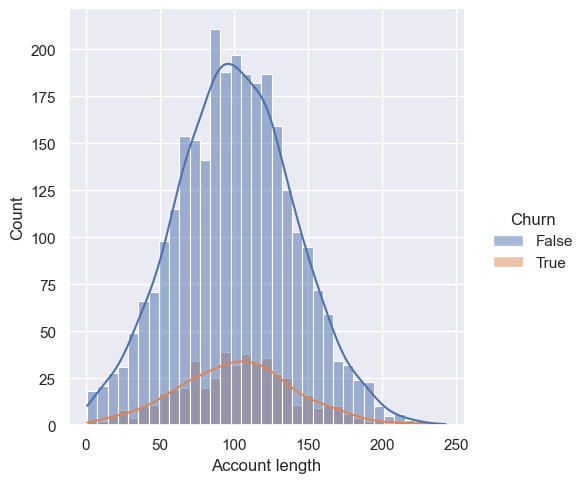

In [45]:
sns.displot(data = df, x='Account length',hue="Churn",kde=True)

<Axes: ylabel='Account length'>

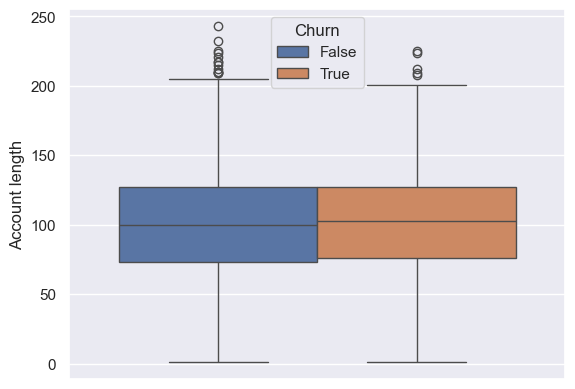

In [46]:
sns.boxplot(data= df,y = 'Account length', hue= "Churn")

In [47]:
len(df['Account length'].unique())

212

In [48]:
# As there are 205 Unique value create a new colume as per the 50% Quartile Distribution
# <=73 , 73-100, 100-127,>127
def transform_account_lenght(num):
    if num <= 73:
        return "Less than 73"
    elif num >73 and num <= 100:
        return "Between 73 and 100"
    elif num >100 and num <= 127:
        return "Between 100 and 127"
    else:
        return "Greater than 127"


In [49]:
df['Account size'] = df['Account length'].apply(transform_account_lenght)

In [50]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Account size
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 127
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Between 100 and 127
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 127
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Between 73 and 100
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Between 73 and 100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,WI,114,415,No,Yes,26,137.1,88,23.31,155.7,125,13.23,247.6,94,11.14,11.5,7,3.11,2,False,Between 100 and 127
3329,AL,106,408,No,Yes,29,83.6,131,14.21,203.9,131,17.33,229.5,73,10.33,8.1,3,2.19,1,False,Between 100 and 127
3330,VT,60,415,No,No,0,193.9,118,32.96,85.0,110,7.23,210.1,134,9.45,13.2,8,3.56,3,False,Less than 73
3331,WV,159,415,No,No,0,169.8,114,28.87,197.7,105,16.80,193.7,82,8.72,11.6,4,3.13,1,False,Greater than 127


In [51]:
pd.crosstab(df['Account size'],df['Churn'],normalize='index')

Churn,False,True
Account size,,
Between 100 and 127,0.844603,0.155397
Between 73 and 100,0.849821,0.150179
Greater than 127,0.857143,0.142857
Less than 73,0.869091,0.130909


<Axes: xlabel='Account size'>

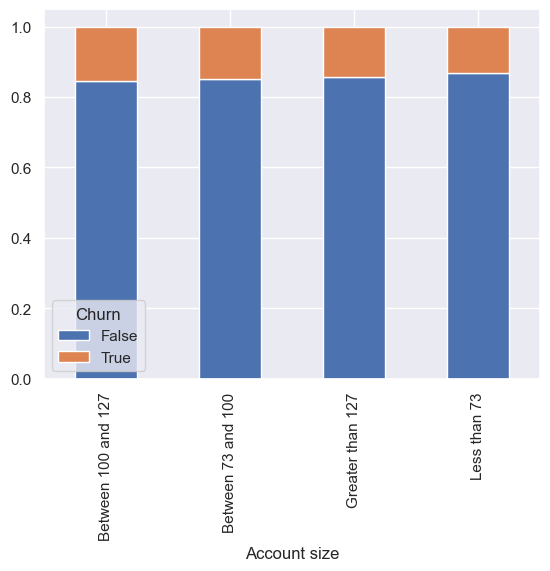

In [52]:
pd.crosstab(df['Account size'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [53]:
corr_value('Account length')

The Corelation value with respect to Account length is: 
Account length            1.000000
Area code                -0.012463
Number vmail messages    -0.004628
Total day minutes         0.006216
Total day calls           0.038470
Total day charge          0.006214
Total eve minutes        -0.006757
Total eve calls           0.019260
Total eve charge         -0.006745
Total night minutes      -0.008955
Total night calls        -0.013176
Total night charge       -0.008960
Total intl minutes        0.009514
Total intl calls          0.020661
Total intl charge         0.009546
Customer service calls   -0.003796
Churn                     0.016541
Name: Account length, dtype: float64


### Area code 
- 3 area code
- There is no impact of Area code on the Target Variable as per the corelation 
- There is no impact on other columns 
- We will ignore this column

In [55]:
df["Area code"].describe()

count    3333.000000
mean      437.182418
std        42.371290
min       408.000000
25%       408.000000
50%       415.000000
75%       510.000000
max       510.000000
Name: Area code, dtype: float64

In [56]:
df["Area code"].unique()

array([415, 408, 510], dtype=int64)

<Axes: xlabel='Area code'>

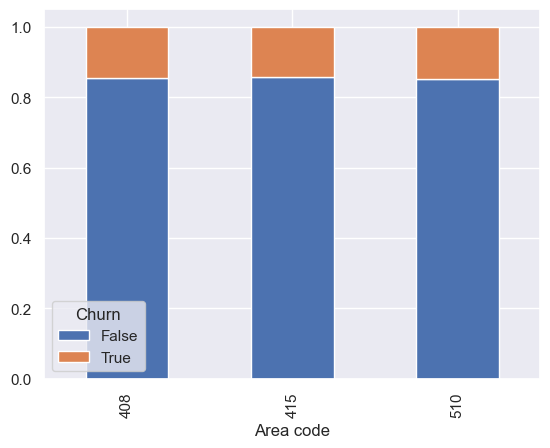

In [57]:
pd.crosstab(df['Area code'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [58]:
pd.crosstab(df['Churn'],df['Area code'],normalize='columns')*100

Area code,408,415,510
Churn,,,
False,85.441527,85.740181,85.119048
True,14.558473,14.259819,14.880952


In [59]:
pd.crosstab(df['International plan'],df['Area code'],normalize='columns')*100

Area code,408,415,510
International plan,,,
No,91.527446,90.936556,87.857143
Yes,8.472554,9.063444,12.142857


In [60]:
pd.crosstab(df['Voice mail plan'],df['Area code'],normalize='columns')*100

Area code,408,415,510
Voice mail plan,,,
No,73.747017,71.540785,72.5
Yes,26.252983,28.459215,27.5


In [61]:
corr_value('Area code')

The Corelation value with respect to Area code is: 
Account length           -0.012463
Area code                 1.000000
Number vmail messages    -0.001994
Total day minutes        -0.008264
Total day calls          -0.009646
Total day charge         -0.008264
Total eve minutes         0.003580
Total eve calls          -0.011886
Total eve charge          0.003607
Total night minutes      -0.005825
Total night calls         0.016522
Total night charge       -0.005845
Total intl minutes       -0.018288
Total intl calls         -0.024179
Total intl charge        -0.018395
Customer service calls    0.027572
Churn                     0.006174
Name: Area code, dtype: float64


### Number vmail messages
- Who dont have Voice Mail Plan does not have the Vmail Message (So, Directly Related)
- We will decide which feature (Voice Mail Plan or Number Vmail Message) to  consider after Encoding the Categorical Columns
- From the finding we conclude that we will ignore this column and take the Voice Mail Plan Column. After pair plot of new_df
- Try to do the further finding with related to the Voice Mail Plan for the Remaining Numerical Column

In [63]:
df["Number vmail messages"].describe()

count    3333.000000
mean        8.099010
std        13.688365
min         0.000000
25%         0.000000
50%         0.000000
75%        20.000000
max        51.000000
Name: Number vmail messages, dtype: float64

In [64]:
df["Number vmail messages"].unique()

array([25, 26,  0, 24, 37, 27, 33, 39, 41, 28, 30, 34, 46, 35, 21, 42, 36,
       22, 23, 43, 31, 38, 40, 29, 18, 32, 17, 45, 16, 14, 20, 19, 15, 12,
       47,  8, 44,  4, 10, 13, 50,  9, 48, 51, 11, 49], dtype=int64)

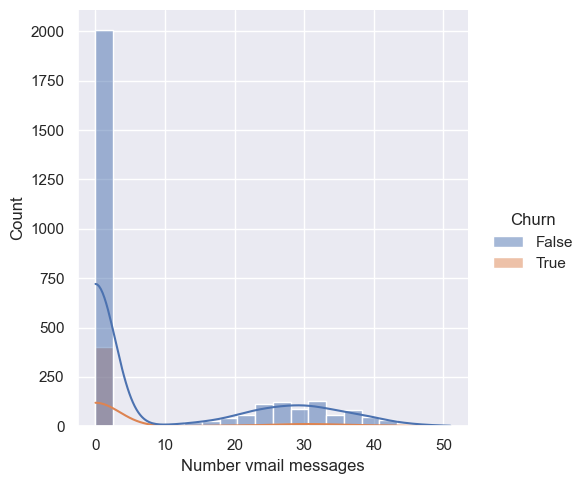

In [65]:
sns.displot(data=df, x= 'Number vmail messages',hue="Churn",kde=True)

In [66]:
pd.crosstab(df['Number vmail messages'],df['Voice mail plan'],normalize='index')*100

Voice mail plan,No,Yes
Number vmail messages,,
0,100.0,0.0
4,0.0,100.0
8,0.0,100.0
9,0.0,100.0
10,0.0,100.0
11,0.0,100.0
12,0.0,100.0
13,0.0,100.0
14,0.0,100.0


In [67]:
pd.crosstab(df['Number vmail messages'],df['Churn'],normalize='index')*100

Churn,False,True
Number vmail messages,,
0,83.284944,16.715056
4,100.000000,0.000000
8,100.000000,0.000000
9,100.000000,0.000000
10,100.000000,0.000000
11,100.000000,0.000000
12,100.000000,0.000000
13,100.000000,0.000000
14,100.000000,0.000000


In [68]:
df.groupby(df["Voice mail plan"])["Number vmail messages"].value_counts()

Voice mail plan  Number vmail messages
No               0                        2411
Yes              31                         60
                 29                         53
                 28                         51
                 33                         46
                 30                         44
                 27                         44
                 24                         42
                 26                         41
                 32                         41
                 25                         37
                 23                         36
                 36                         34
                 22                         32
                 35                         32
                 39                         30
                 37                         29
                 34                         29
                 21                         28
                 38                         25
                 20  

In [69]:
corr_value('Number vmail messages')

The Corelation value with respect to Number vmail messages is: 
Account length           -0.004628
Area code                -0.001994
Number vmail messages     1.000000
Total day minutes         0.000778
Total day calls          -0.009548
Total day charge          0.000776
Total eve minutes         0.017562
Total eve calls          -0.005864
Total eve charge          0.017578
Total night minutes       0.007681
Total night calls         0.007123
Total night charge        0.007663
Total intl minutes        0.002856
Total intl calls          0.013957
Total intl charge         0.002884
Customer service calls   -0.013263
Churn                    -0.089728
Name: Number vmail messages, dtype: float64


### Total day minutes 
- Total day minutes and total day charge are correlated so we will use the feature which is highly correlated with the Target Column.
- As both are equally correated with the Churn so We will drop the Total day charge Feature
- Those who have high total day minutes are more likly to exit
- Who don't have Voice mail plan and have higher day minutes are more likely to exit
- When there is False Churn Rate there are some of outlires.

In [71]:
df["Total day minutes"].describe()

count    3333.000000
mean      179.775098
std        54.467389
min         0.000000
25%       143.700000
50%       179.400000
75%       216.400000
max       350.800000
Name: Total day minutes, dtype: float64

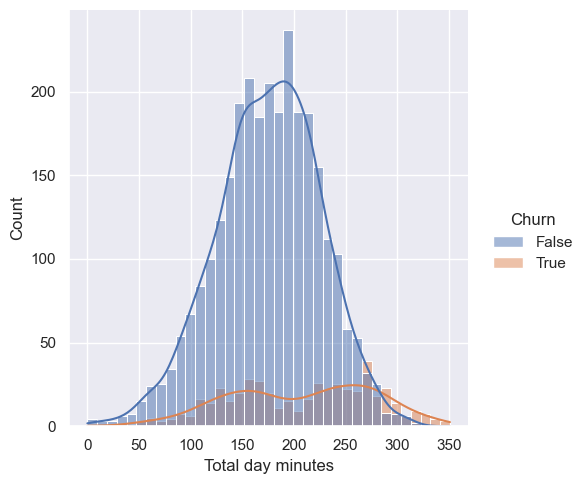

In [72]:
sns.displot(data = df, x = 'Total day minutes',kde=True, hue = "Churn")

<Axes: ylabel='Total day minutes'>

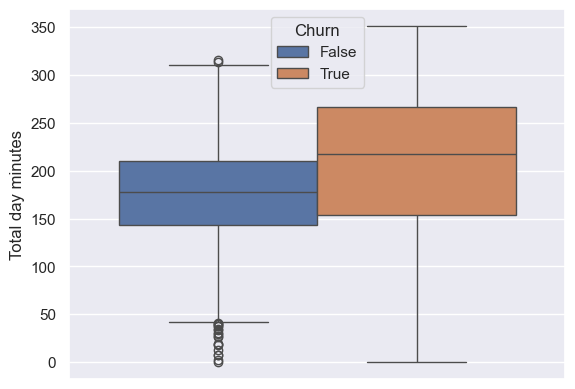

In [73]:
sns.boxplot(data= df,y = 'Total day minutes', hue= "Churn")

<Axes: xlabel='Total day minutes', ylabel='Total day minutes'>

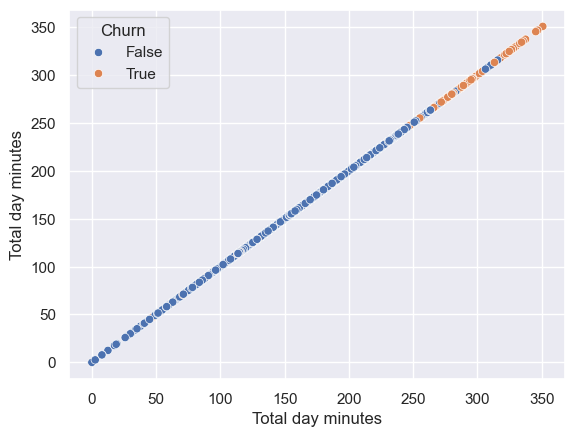

In [74]:
sns.scatterplot(data= df,x = 'Total day minutes',y = 'Total day minutes', hue= "Churn")

<Axes: xlabel='Total day minutes', ylabel='Total day charge'>

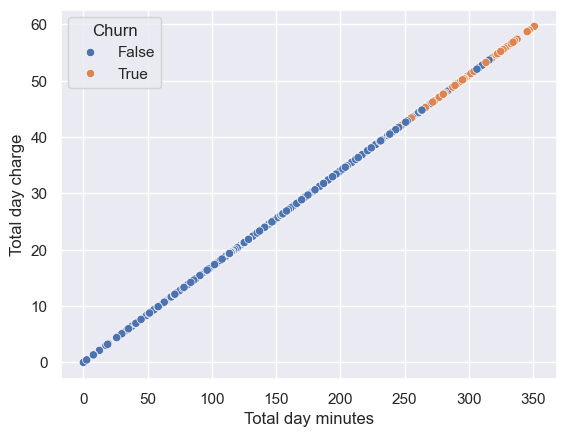

In [75]:
sns.scatterplot(data= df,x = 'Total day minutes',y = 'Total day charge', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total day minutes'>

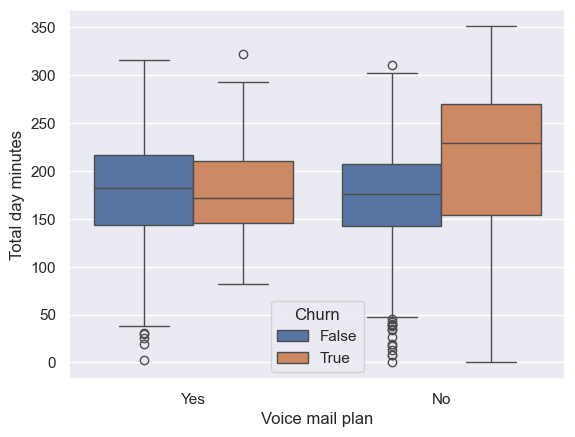

In [76]:
sns.boxplot(data= df,y = 'Total day minutes' ,x = "Voice mail plan", hue= "Churn")

<Axes: xlabel='Number vmail messages', ylabel='Total day minutes'>

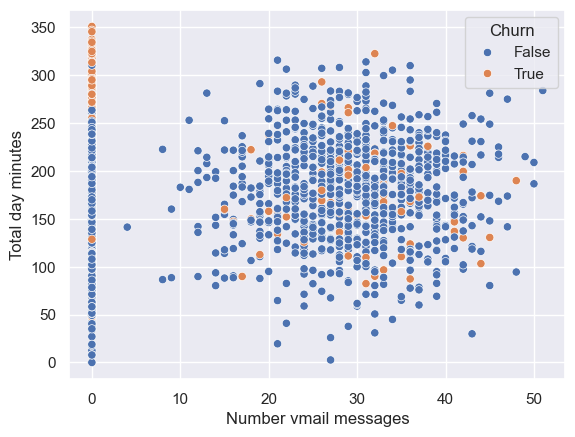

In [77]:
sns.scatterplot(data= df,y = 'Total day minutes',x = 'Number vmail messages', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total day minutes'>

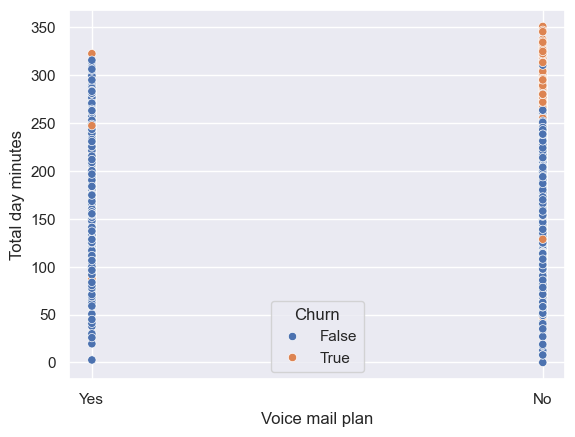

In [78]:
sns.scatterplot(data= df,y = 'Total day minutes',x = 'Voice mail plan', hue= "Churn")

In [79]:
corr_value("Total day minutes")

The Corelation value with respect to Total day minutes is: 
Account length            0.006216
Area code                -0.008264
Number vmail messages     0.000778
Total day minutes         1.000000
Total day calls           0.006750
Total day charge          1.000000
Total eve minutes         0.007043
Total eve calls           0.015769
Total eve charge          0.007029
Total night minutes       0.004323
Total night calls         0.022972
Total night charge        0.004300
Total intl minutes       -0.010155
Total intl calls          0.008033
Total intl charge        -0.010092
Customer service calls   -0.013423
Churn                     0.205151
Name: Total day minutes, dtype: float64


In [80]:
cor_min = df['Total day minutes'].corr(df['Churn'])
cor_charge = df['Total day charge'].corr(df['Churn'])
print(f"The correlation between Total day minutes and Churn is {cor_min}")
print(f"The correlation between Total day Charge and Churn is {cor_charge}")

The correlation between Total day minutes and Churn is 0.20515082926139033
The correlation between Total day Charge and Churn is 0.20515074317015375


### Total day calls
- There is no any relation of the total day calls with other columns 
- we can ignore this column for our model 
- There is equal probality of leaving the service on context of day calls

In [82]:
df["Total day calls"].describe()

count    3333.000000
mean      100.435644
std        20.069084
min         0.000000
25%        87.000000
50%       101.000000
75%       114.000000
max       165.000000
Name: Total day calls, dtype: float64

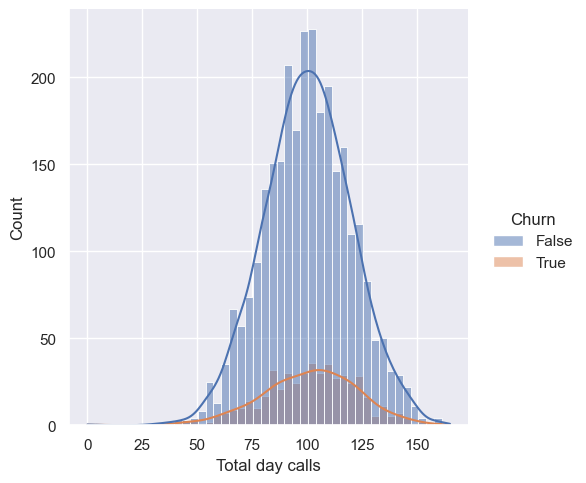

In [83]:
sns.displot(data = df, x = 'Total day calls',kde=True, hue = "Churn")

<Axes: ylabel='Total day calls'>

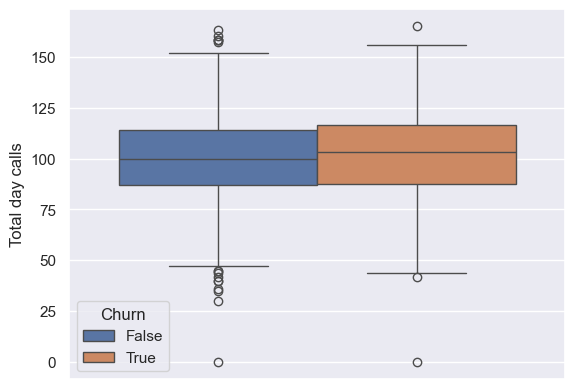

In [84]:
sns.boxplot(data= df,y = 'Total day calls', hue= "Churn")

<Axes: xlabel='Total day calls', ylabel='Total day calls'>

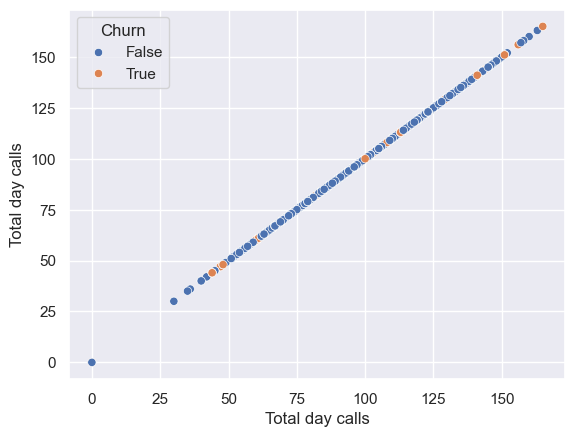

In [85]:
sns.scatterplot(data= df,x = 'Total day calls',y = 'Total day calls', hue= "Churn")

<Axes: xlabel='Total day calls', ylabel='Total day minutes'>

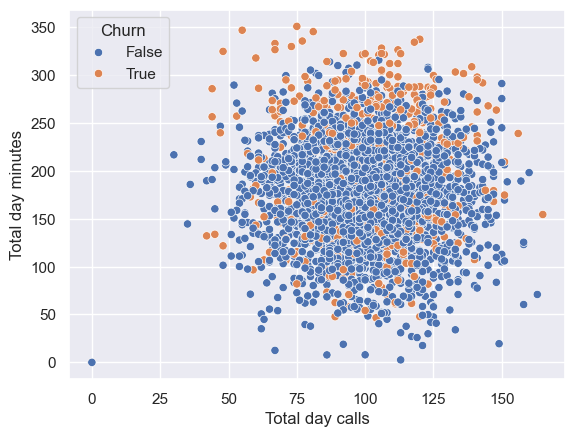

In [86]:
sns.scatterplot(data= df,x = 'Total day calls',y = 'Total day minutes', hue= "Churn")

In [87]:
len(df['Total day calls'].unique())

119

In [88]:
# As there are 115 Unique value create a new colume as per the 50% Quartile Distribution
# <=75 , 73-100, 100-127,>127
def transform_day_calls(num):
    if num <= 101:
        return "Less than 101"
    #elif num >73 and num <= 100:
       # return "Between 73 and 100"
    #elif num >100 and num <= 127:
        #return "Between 100 and 127"
    else:
        return "Greater than 101"

In [89]:
df['Day calls'] = df['Total day calls'].apply(transform_day_calls)

In [90]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Account size,Day calls
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 127,Greater than 101
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Between 100 and 127,Greater than 101
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 127,Greater than 101
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Between 73 and 100,Less than 101
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Between 73 and 100,Greater than 101
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,WI,114,415,No,Yes,26,137.1,88,23.31,155.7,125,13.23,247.6,94,11.14,11.5,7,3.11,2,False,Between 100 and 127,Less than 101
3329,AL,106,408,No,Yes,29,83.6,131,14.21,203.9,131,17.33,229.5,73,10.33,8.1,3,2.19,1,False,Between 100 and 127,Greater than 101
3330,VT,60,415,No,No,0,193.9,118,32.96,85.0,110,7.23,210.1,134,9.45,13.2,8,3.56,3,False,Less than 73,Greater than 101
3331,WV,159,415,No,No,0,169.8,114,28.87,197.7,105,16.80,193.7,82,8.72,11.6,4,3.13,1,False,Greater than 127,Greater than 101


<Axes: xlabel='Day calls'>

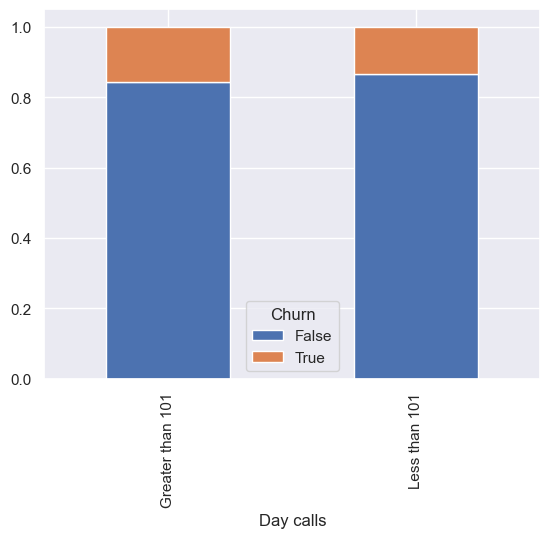

In [91]:
pd.crosstab(df['Day calls'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [92]:
corr_value('Total day calls')

The Corelation value with respect to Total day calls is: 
Account length            0.038470
Area code                -0.009646
Number vmail messages    -0.009548
Total day minutes         0.006750
Total day calls           1.000000
Total day charge          0.006753
Total eve minutes        -0.021451
Total eve calls           0.006462
Total eve charge         -0.021449
Total night minutes       0.022938
Total night calls        -0.019557
Total night charge        0.022927
Total intl minutes        0.021565
Total intl calls          0.004574
Total intl charge         0.021666
Customer service calls   -0.018942
Churn                     0.018459
Name: Total day calls, dtype: float64


### Total day charge 
- Higly correalted with the Total day minutes so we ignore this column

<Axes: xlabel='Total day minutes', ylabel='Total day charge'>

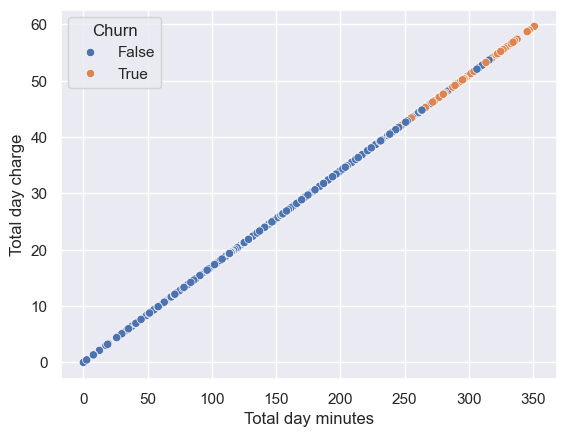

In [94]:
sns.scatterplot(data= df,x = 'Total day minutes',y = 'Total day charge', hue= "Churn")

In [95]:
corr_value("Total day charge")

The Corelation value with respect to Total day charge is: 
Account length            0.006214
Area code                -0.008264
Number vmail messages     0.000776
Total day minutes         1.000000
Total day calls           0.006753
Total day charge          1.000000
Total eve minutes         0.007050
Total eve calls           0.015769
Total eve charge          0.007036
Total night minutes       0.004324
Total night calls         0.022972
Total night charge        0.004301
Total intl minutes       -0.010157
Total intl calls          0.008032
Total intl charge        -0.010094
Customer service calls   -0.013427
Churn                     0.205151
Name: Total day charge, dtype: float64


In [96]:
cor_min = df['Total day minutes'].corr(df['Churn'])
cor_charge = df['Total day charge'].corr(df['Churn'])
print(f"The correlation between Total day minutes and Churn is {cor_min}")
print(f"The correlation between Total day Charge and Churn is {cor_charge}")

The correlation between Total day minutes and Churn is 0.20515082926139033
The correlation between Total day Charge and Churn is 0.20515074317015375


### Total eve minutes
- Total eve minutes and total eve charge are correlated so we will use the feature which is highly correlated with the Target Column.
- As both are equally correated with the Churn so We will drop the Total eve charge Feature
- Those who have high total eve minutes are slightly more likly to exit
- Who don't have Voice mail plan and have higher eve minutes are shigly more likely to exit
- There are some outliers in both Churn Rate so need to treat the outliers

In [98]:
df["Total eve minutes"].describe()

count    3333.000000
mean      200.980348
std        50.713844
min         0.000000
25%       166.600000
50%       201.400000
75%       235.300000
max       363.700000
Name: Total eve minutes, dtype: float64

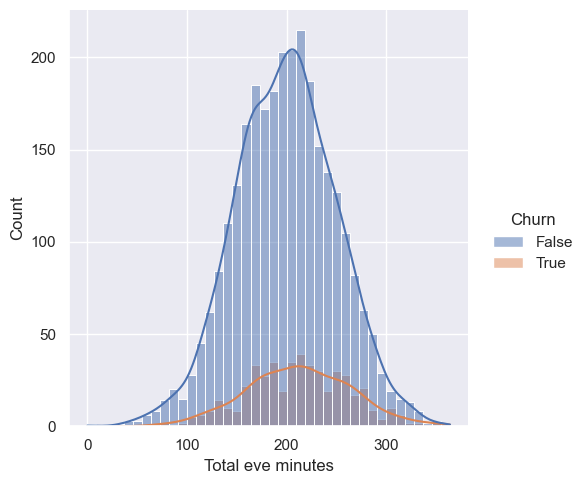

In [99]:
sns.displot(data = df, x = 'Total eve minutes',kde=True, hue = "Churn")

<Axes: ylabel='Total eve minutes'>

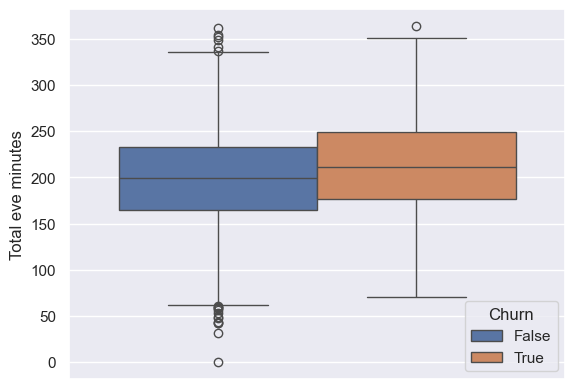

In [100]:
sns.boxplot(data= df,y = 'Total eve minutes', hue= "Churn")

<Axes: xlabel='Total eve minutes', ylabel='Total eve minutes'>

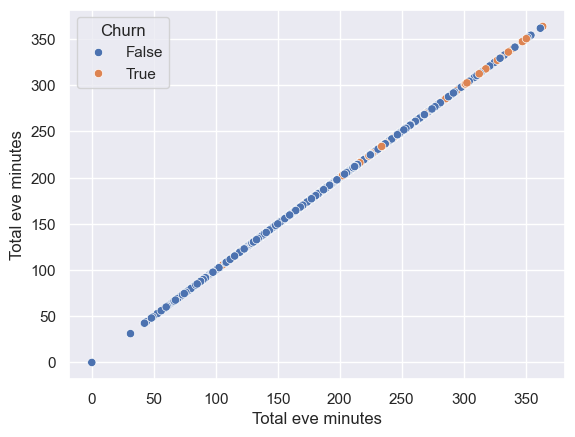

In [101]:
sns.scatterplot(data= df,x = 'Total eve minutes',y = 'Total eve minutes', hue= "Churn")

<Axes: xlabel='Total eve minutes', ylabel='Total eve charge'>

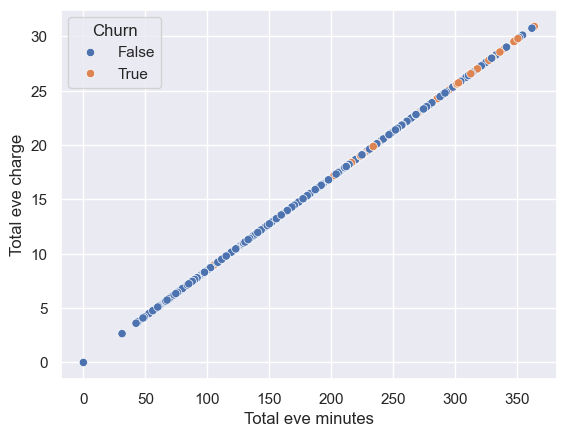

In [102]:
sns.scatterplot(data= df,x = 'Total eve minutes',y = 'Total eve charge', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total eve minutes'>

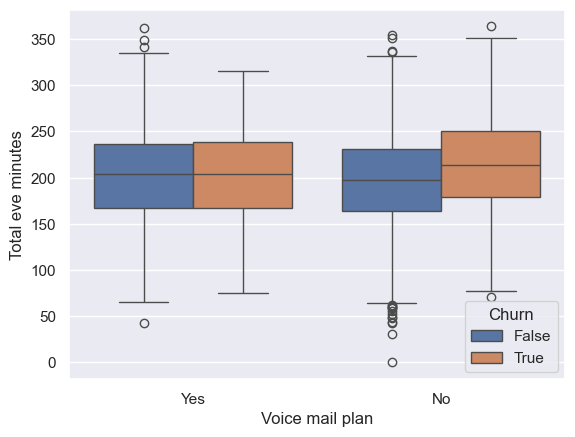

In [103]:
sns.boxplot(data= df,y = 'Total eve minutes' ,x = "Voice mail plan", hue= "Churn")

<Axes: xlabel='Number vmail messages', ylabel='Total eve minutes'>

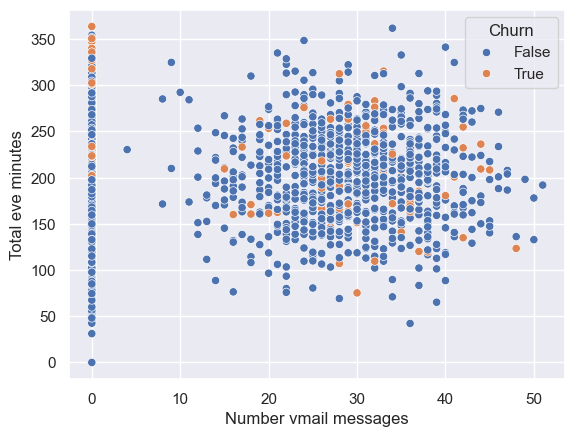

In [104]:
sns.scatterplot(data= df,y = 'Total eve minutes',x = 'Number vmail messages', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total eve minutes'>

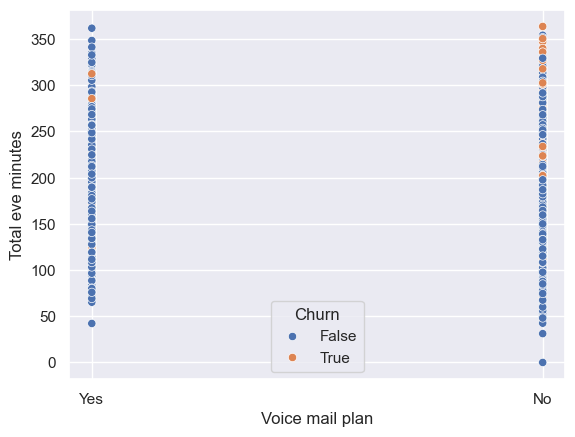

In [105]:
sns.scatterplot(data= df,y = 'Total eve minutes',x = 'Voice mail plan', hue= "Churn")

In [106]:
len(df["Total eve minutes"].unique())

1611

In [107]:
# As there are 1442 Unique value create a new colume as per the 50% Quartile Distribution
# <=75 , 73-100, 100-127,>127
def transform_eve_mins(num):
    if num <= 200:
        return "Less than 200"
    #elif num >73 and num <= 100:
       # return "Between 73 and 100"
    #elif num >100 and num <= 127:
        #return "Between 100 and 127"
    else:
        return "Greater than 200"

In [108]:
df["Eve minutes"] = df["Total eve minutes"].apply(transform_eve_mins)

In [109]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Account size,Day calls,Eve minutes
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 127,Greater than 101,Less than 200
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Between 100 and 127,Greater than 101,Less than 200
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 127,Greater than 101,Less than 200
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Between 73 and 100,Less than 101,Less than 200
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Between 73 and 100,Greater than 101,Less than 200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,WI,114,415,No,Yes,26,137.1,88,23.31,155.7,125,13.23,247.6,94,11.14,11.5,7,3.11,2,False,Between 100 and 127,Less than 101,Less than 200
3329,AL,106,408,No,Yes,29,83.6,131,14.21,203.9,131,17.33,229.5,73,10.33,8.1,3,2.19,1,False,Between 100 and 127,Greater than 101,Greater than 200
3330,VT,60,415,No,No,0,193.9,118,32.96,85.0,110,7.23,210.1,134,9.45,13.2,8,3.56,3,False,Less than 73,Greater than 101,Less than 200
3331,WV,159,415,No,No,0,169.8,114,28.87,197.7,105,16.80,193.7,82,8.72,11.6,4,3.13,1,False,Greater than 127,Greater than 101,Less than 200


<Axes: xlabel='Eve minutes'>

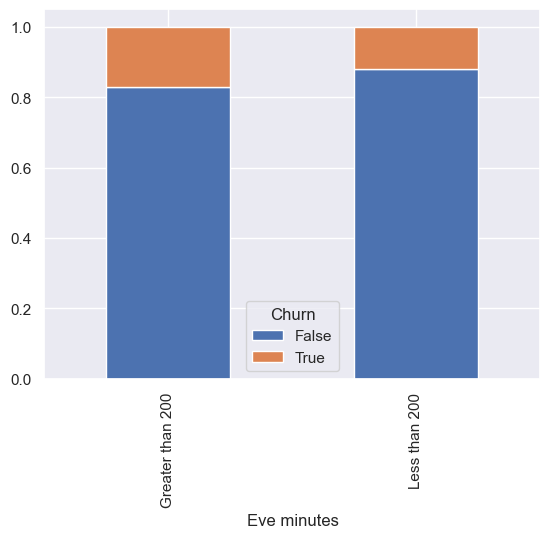

In [110]:
pd.crosstab(df['Eve minutes'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [111]:
corr_value("Total eve minutes")

The Corelation value with respect to Total eve minutes is: 
Account length           -0.006757
Area code                 0.003580
Number vmail messages     0.017562
Total day minutes         0.007043
Total day calls          -0.021451
Total day charge          0.007050
Total eve minutes         1.000000
Total eve calls          -0.011430
Total eve charge          1.000000
Total night minutes      -0.012584
Total night calls         0.007586
Total night charge       -0.012593
Total intl minutes       -0.011035
Total intl calls          0.002541
Total intl charge        -0.011067
Customer service calls   -0.012985
Churn                     0.092796
Name: Total eve minutes, dtype: float64


In [112]:
cor_min = df['Total eve minutes'].corr(df['Churn'])
cor_charge = df['Total eve charge'].corr(df['Churn'])
print(f"The correlation between Total eve minutes and Churn is {cor_min}")
print(f"The correlation between Total eve Charge and Churn is {cor_charge}")

The correlation between Total eve minutes and Churn is 0.09279579031259168
The correlation between Total eve Charge and Churn is 0.09278603942871358


### Total eve calls
- It has the equal probalbility so it can be ignored

In [114]:
df["Total eve calls"].describe()

count    3333.000000
mean      100.114311
std        19.922625
min         0.000000
25%        87.000000
50%       100.000000
75%       114.000000
max       170.000000
Name: Total eve calls, dtype: float64

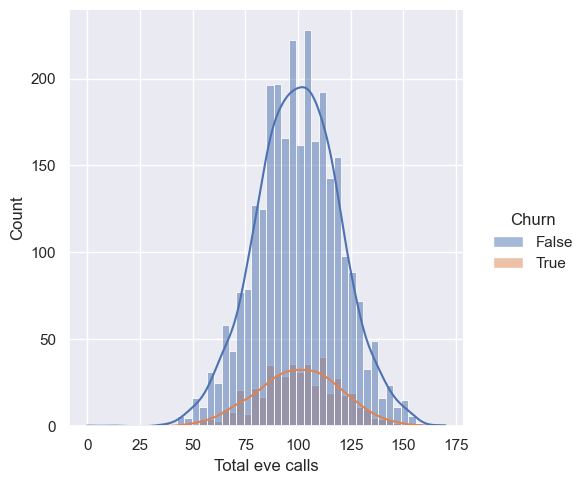

In [115]:
sns.displot(data = df, x = 'Total eve calls',kde=True, hue = "Churn")

In [116]:
 len(df["Total eve calls"].unique())

123

In [117]:
# As there are 1442 Unique value create a new colume as per the 50% Quartile Distribution
# <=75 , 73-100, 100-127,>127
def transform_eve_calls(num):
    if num <= 100:
        return "Less than 100"
    #elif num >73 and num <= 100:
       # return "Between 73 and 100"
    #elif num >100 and num <= 127:
        #return "Between 100 and 127"
    else:
        return "Greater than 100"

In [118]:
df["Eve calls"] = df["Total eve calls"].apply(transform_eve_calls)

In [119]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Account size,Day calls,Eve minutes,Eve calls
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 127,Greater than 101,Less than 200,Less than 100
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Between 100 and 127,Greater than 101,Less than 200,Greater than 100
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 127,Greater than 101,Less than 200,Greater than 100
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Between 73 and 100,Less than 101,Less than 200,Less than 100
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Between 73 and 100,Greater than 101,Less than 200,Greater than 100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,WI,114,415,No,Yes,26,137.1,88,23.31,155.7,125,13.23,247.6,94,11.14,11.5,7,3.11,2,False,Between 100 and 127,Less than 101,Less than 200,Greater than 100
3329,AL,106,408,No,Yes,29,83.6,131,14.21,203.9,131,17.33,229.5,73,10.33,8.1,3,2.19,1,False,Between 100 and 127,Greater than 101,Greater than 200,Greater than 100
3330,VT,60,415,No,No,0,193.9,118,32.96,85.0,110,7.23,210.1,134,9.45,13.2,8,3.56,3,False,Less than 73,Greater than 101,Less than 200,Greater than 100
3331,WV,159,415,No,No,0,169.8,114,28.87,197.7,105,16.80,193.7,82,8.72,11.6,4,3.13,1,False,Greater than 127,Greater than 101,Less than 200,Greater than 100


<Axes: xlabel='Eve calls'>

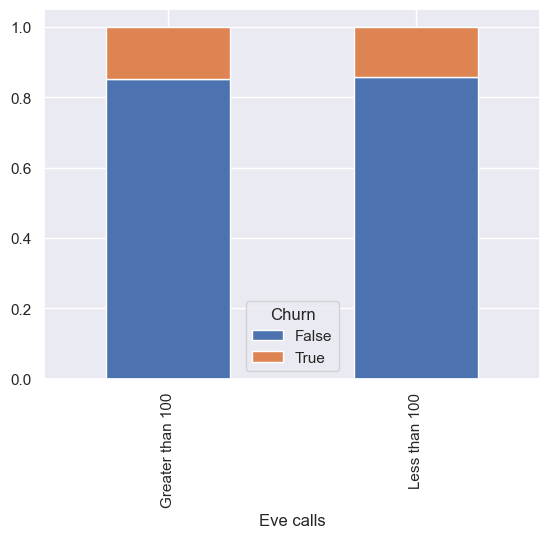

In [120]:
pd.crosstab(df['Eve calls'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [121]:
corr_value("Total eve calls")

The Corelation value with respect to Total eve calls is: 
Account length            0.019260
Area code                -0.011886
Number vmail messages    -0.005864
Total day minutes         0.015769
Total day calls           0.006462
Total day charge          0.015769
Total eve minutes        -0.011430
Total eve calls           1.000000
Total eve charge         -0.011423
Total night minutes      -0.002093
Total night calls         0.007710
Total night charge       -0.002056
Total intl minutes        0.008703
Total intl calls          0.017434
Total intl charge         0.008674
Customer service calls    0.002423
Churn                     0.009233
Name: Total eve calls, dtype: float64


### Total eve charge
- As it is postivily related to Total eve minutes so we ignore this column

### Total night minutes
- It doesnot have that much impact on the target or any other column yet we decide to keep this feature
- Positively correlated with Total night charge hence we keep this feature only

In [124]:
df["Total night minutes"].describe()

count    3333.000000
mean      200.872037
std        50.573847
min        23.200000
25%       167.000000
50%       201.200000
75%       235.300000
max       395.000000
Name: Total night minutes, dtype: float64

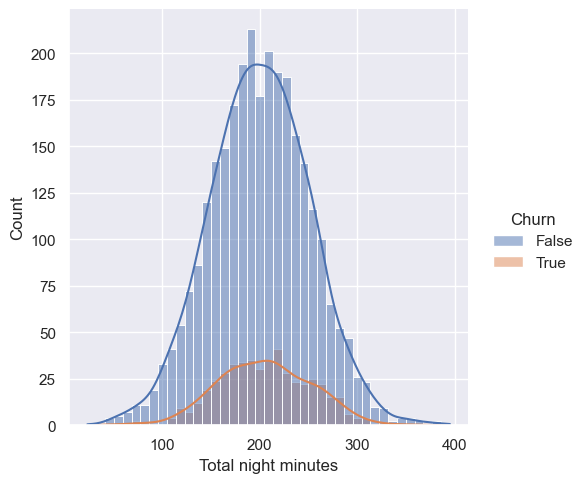

In [125]:
sns.displot(data = df, x = 'Total night minutes',kde=True, hue = "Churn")

<Axes: ylabel='Total night minutes'>

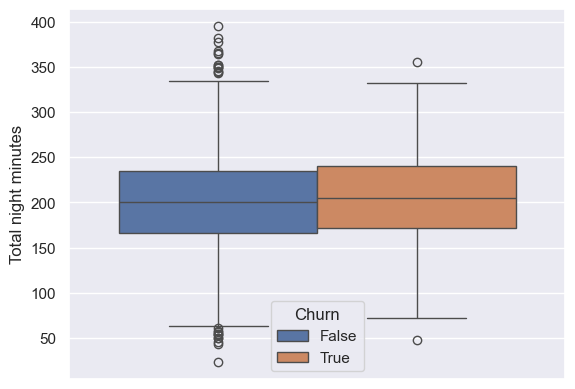

In [126]:
sns.boxplot(data= df,y = 'Total night minutes', hue= "Churn")

<Axes: xlabel='Total night minutes', ylabel='Total night minutes'>

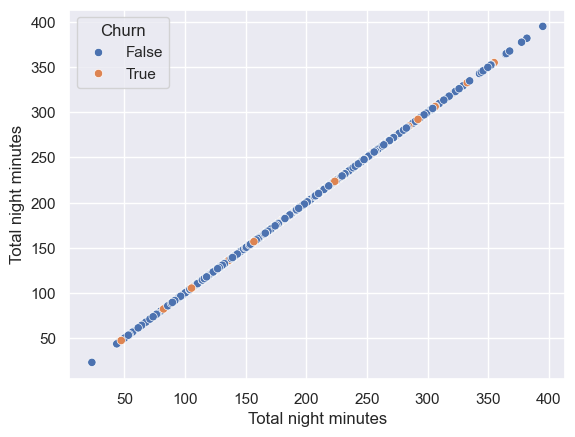

In [127]:
sns.scatterplot(data= df,x = 'Total night minutes',y = 'Total night minutes', hue= "Churn")

<Axes: xlabel='Total night minutes', ylabel='Total night charge'>

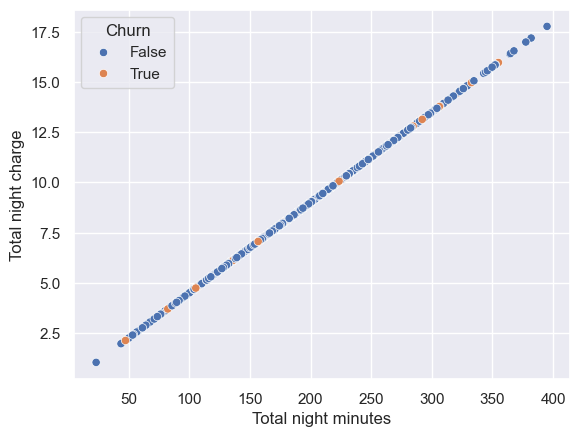

In [128]:
sns.scatterplot(data= df,x = 'Total night minutes',y = 'Total night charge', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total night minutes'>

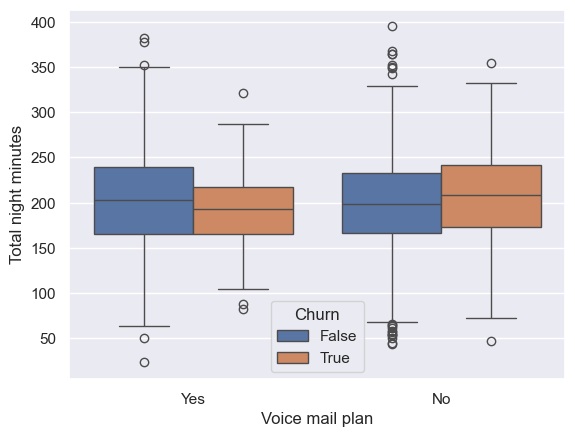

In [129]:
sns.boxplot(data= df,y = 'Total night minutes' ,x = "Voice mail plan", hue= "Churn")

<Axes: xlabel='Number vmail messages', ylabel='Total night minutes'>

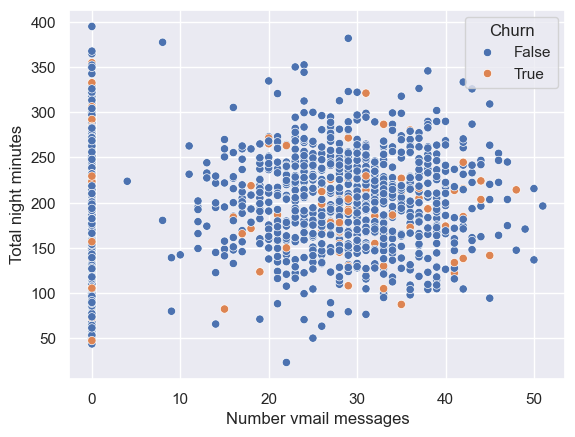

In [130]:
sns.scatterplot(data= df,y = 'Total night minutes',x = 'Number vmail messages', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total night minutes'>

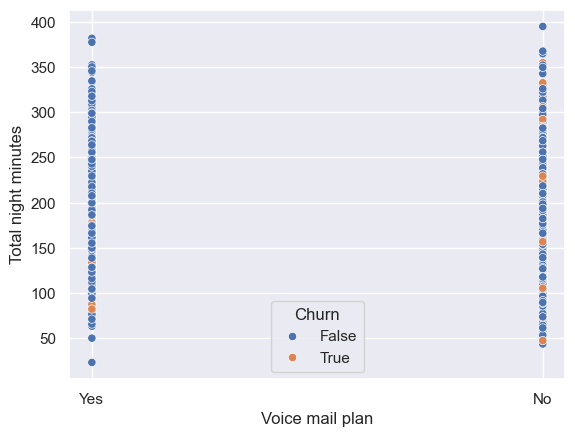

In [131]:
sns.scatterplot(data= df,y = 'Total night minutes',x = 'Voice mail plan', hue= "Churn")

In [132]:
len(df["Total night minutes"].unique())

1591

In [133]:
# As there are 1442 Unique value create a new colume as per the 50% Quartile Distribution
def transform_night_mins(num):
    if num <= 201:
        return "Less than 201"
    #elif num >73 and num <= 100:
       # return "Between 73 and 100"
    #elif num >100 and num <= 127:
        #return "Between 100 and 127"
    else:
        return "Greater than 201"

In [134]:
df["Night minutes"] = df["Total night minutes"].apply(transform_night_mins)

In [135]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Account size,Day calls,Eve minutes,Eve calls,Night minutes
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 127,Greater than 101,Less than 200,Less than 100,Greater than 201
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Between 100 and 127,Greater than 101,Less than 200,Greater than 100,Greater than 201
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 127,Greater than 101,Less than 200,Greater than 100,Less than 201
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Between 73 and 100,Less than 101,Less than 200,Less than 100,Less than 201
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Between 73 and 100,Greater than 101,Less than 200,Greater than 100,Less than 201
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,WI,114,415,No,Yes,26,137.1,88,23.31,155.7,125,13.23,247.6,94,11.14,11.5,7,3.11,2,False,Between 100 and 127,Less than 101,Less than 200,Greater than 100,Greater than 201
3329,AL,106,408,No,Yes,29,83.6,131,14.21,203.9,131,17.33,229.5,73,10.33,8.1,3,2.19,1,False,Between 100 and 127,Greater than 101,Greater than 200,Greater than 100,Greater than 201
3330,VT,60,415,No,No,0,193.9,118,32.96,85.0,110,7.23,210.1,134,9.45,13.2,8,3.56,3,False,Less than 73,Greater than 101,Less than 200,Greater than 100,Greater than 201
3331,WV,159,415,No,No,0,169.8,114,28.87,197.7,105,16.80,193.7,82,8.72,11.6,4,3.13,1,False,Greater than 127,Greater than 101,Less than 200,Greater than 100,Less than 201


<Axes: xlabel='Night minutes'>

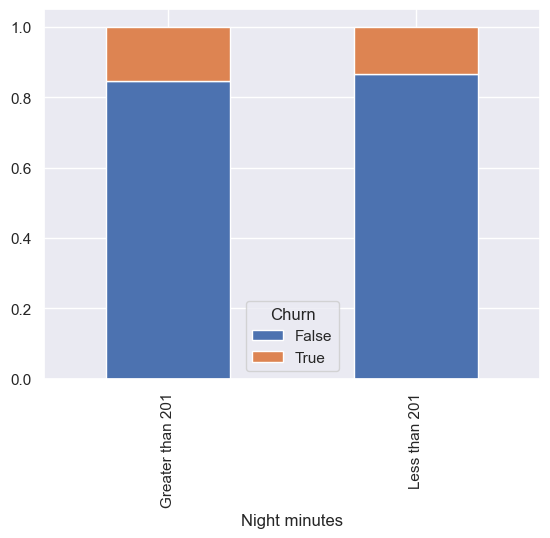

In [136]:
pd.crosstab(df['Night minutes'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [137]:
corr_value("Total night minutes")

The Corelation value with respect to Total night minutes is: 
Account length           -0.008955
Area code                -0.005825
Number vmail messages     0.007681
Total day minutes         0.004323
Total day calls           0.022938
Total day charge          0.004324
Total eve minutes        -0.012584
Total eve calls          -0.002093
Total eve charge         -0.012592
Total night minutes       1.000000
Total night calls         0.011204
Total night charge        0.999999
Total intl minutes       -0.015207
Total intl calls         -0.012353
Total intl charge        -0.015180
Customer service calls   -0.009288
Churn                     0.035493
Name: Total night minutes, dtype: float64


In [138]:
cor_min = df['Total night minutes'].corr(df['Churn'])
cor_charge = df['Total night charge'].corr(df['Churn'])
print(f"The correlation between Total night minutes and Churn is {cor_min}")
print(f"The correlation between Total night Charge and Churn is {cor_charge}")

The correlation between Total night minutes and Churn is 0.035492853421274034
The correlation between Total night Charge and Churn is 0.03549555624050671


### Total night calls
- As there is equal probability we ignore this feature

In [140]:
df["Total night calls"].describe()

count    3333.000000
mean      100.107711
std        19.568609
min        33.000000
25%        87.000000
50%       100.000000
75%       113.000000
max       175.000000
Name: Total night calls, dtype: float64

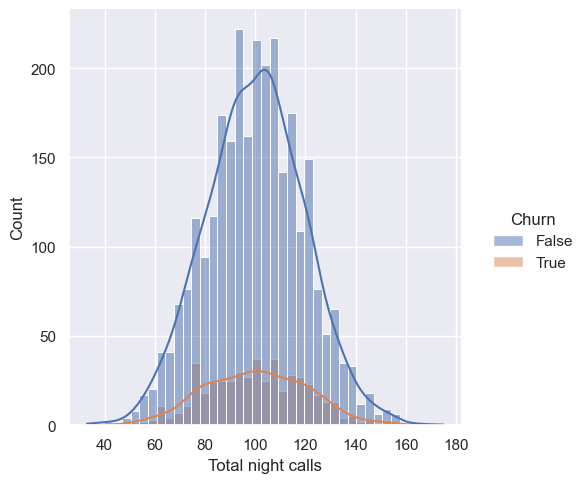

In [141]:
sns.displot(data = df, x = 'Total night calls',kde=True, hue = "Churn")

In [142]:
 len(df["Total eve calls"].unique())

123

In [143]:
# As there are 1442 Unique value create a new colume as per the 50% Quartile Distribution
def transform_night_calls(num):
    if num <= 100:
        return "Less than 100"
    #elif num >73 and num <= 100:
       # return "Between 73 and 100"
    #elif num >100 and num <= 127:
        #return "Between 100 and 127"
    else:
        return "Greater than 100"

In [144]:
df["Night calls"] = df["Total night calls"].apply(transform_night_calls)

In [145]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Account size,Day calls,Eve minutes,Eve calls,Night minutes,Night calls
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 127,Greater than 101,Less than 200,Less than 100,Greater than 201,Less than 100
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Between 100 and 127,Greater than 101,Less than 200,Greater than 100,Greater than 201,Greater than 100
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 127,Greater than 101,Less than 200,Greater than 100,Less than 201,Greater than 100
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Between 73 and 100,Less than 101,Less than 200,Less than 100,Less than 201,Less than 100
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Between 73 and 100,Greater than 101,Less than 200,Greater than 100,Less than 201,Greater than 100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,WI,114,415,No,Yes,26,137.1,88,23.31,155.7,125,13.23,247.6,94,11.14,11.5,7,3.11,2,False,Between 100 and 127,Less than 101,Less than 200,Greater than 100,Greater than 201,Less than 100
3329,AL,106,408,No,Yes,29,83.6,131,14.21,203.9,131,17.33,229.5,73,10.33,8.1,3,2.19,1,False,Between 100 and 127,Greater than 101,Greater than 200,Greater than 100,Greater than 201,Less than 100
3330,VT,60,415,No,No,0,193.9,118,32.96,85.0,110,7.23,210.1,134,9.45,13.2,8,3.56,3,False,Less than 73,Greater than 101,Less than 200,Greater than 100,Greater than 201,Greater than 100
3331,WV,159,415,No,No,0,169.8,114,28.87,197.7,105,16.80,193.7,82,8.72,11.6,4,3.13,1,False,Greater than 127,Greater than 101,Less than 200,Greater than 100,Less than 201,Less than 100


<Axes: xlabel='Night calls'>

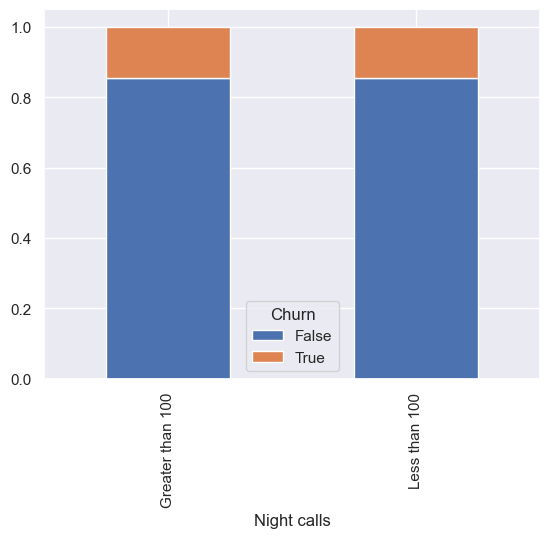

In [146]:
pd.crosstab(df['Night calls'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [147]:
corr_value("Total night calls")

The Corelation value with respect to Total night calls is: 
Account length           -0.013176
Area code                 0.016522
Number vmail messages     0.007123
Total day minutes         0.022972
Total day calls          -0.019557
Total day charge          0.022972
Total eve minutes         0.007586
Total eve calls           0.007710
Total eve charge          0.007596
Total night minutes       0.011204
Total night calls         1.000000
Total night charge        0.011188
Total intl minutes       -0.013605
Total intl calls          0.000305
Total intl charge        -0.013630
Customer service calls   -0.012802
Churn                     0.006141
Name: Total night calls, dtype: float64


### Total night charge
- As positively correlated with the Total night minutes hence we ignore

### Total intl minutes 
- Those who have international plan and  has the internation minute are more likely to exit
- positively correalted to the Total intl charge so we ignore Total intl charge feature
- Need to verity once doing the outlier treatement

In [150]:
df["Total intl minutes"].describe()

count    3333.000000
mean       10.237294
std         2.791840
min         0.000000
25%         8.500000
50%        10.300000
75%        12.100000
max        20.000000
Name: Total intl minutes, dtype: float64

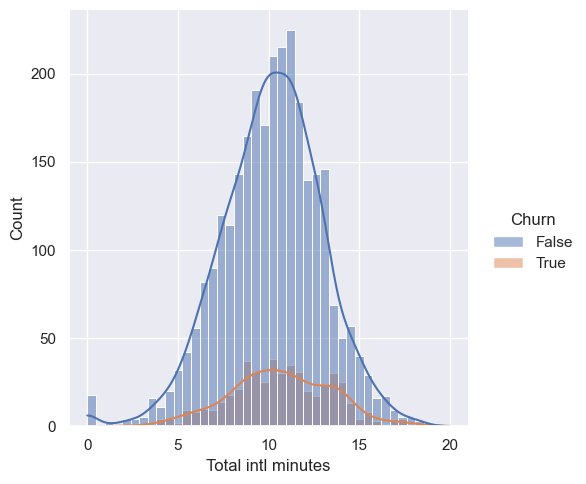

In [151]:
sns.displot(data = df, x = 'Total intl minutes',kde=True, hue = "Churn")

<Axes: ylabel='Total intl minutes'>

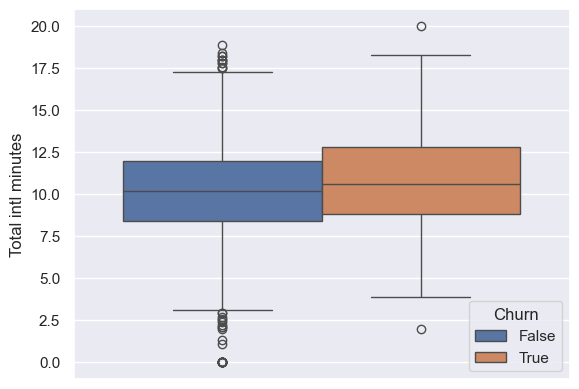

In [152]:
sns.boxplot(data= df,y = 'Total intl minutes', hue= "Churn")

<Axes: xlabel='Total intl minutes', ylabel='Total intl minutes'>

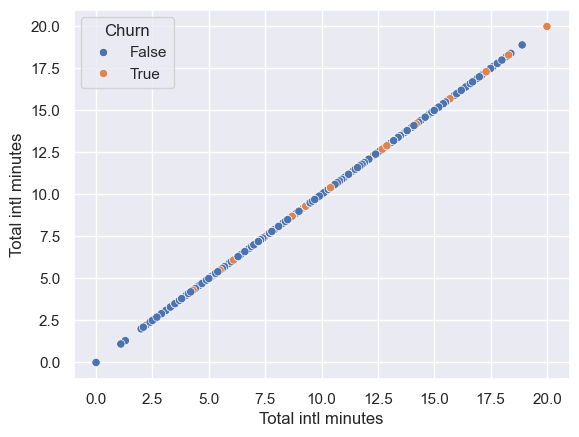

In [153]:
sns.scatterplot(data= df,x = 'Total intl minutes',y = 'Total intl minutes', hue= "Churn")

<Axes: xlabel='Total intl minutes', ylabel='Total intl charge'>

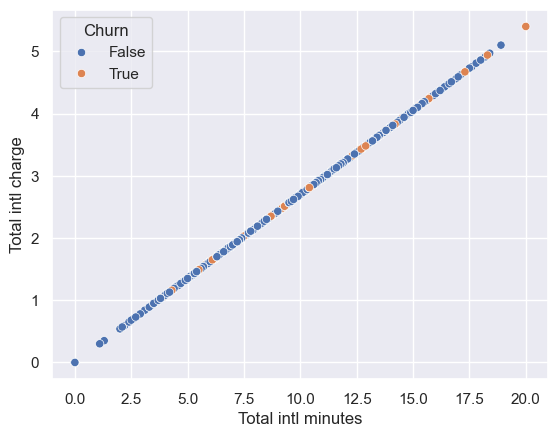

In [154]:
sns.scatterplot(data= df,x = 'Total intl minutes',y = 'Total intl charge', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total intl minutes'>

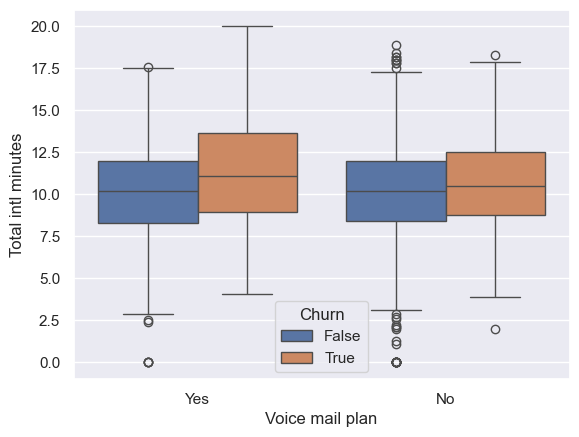

In [155]:
sns.boxplot(data= df,y = 'Total intl minutes' ,x = "Voice mail plan", hue= "Churn")

<Axes: xlabel='Number vmail messages', ylabel='Total intl minutes'>

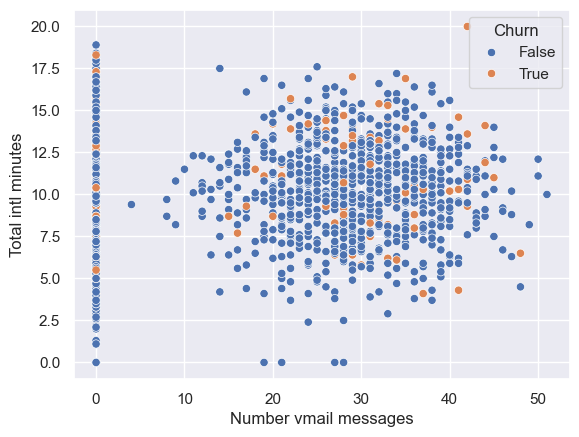

In [156]:
sns.scatterplot(data= df,y = 'Total intl minutes',x = 'Number vmail messages', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total intl minutes'>

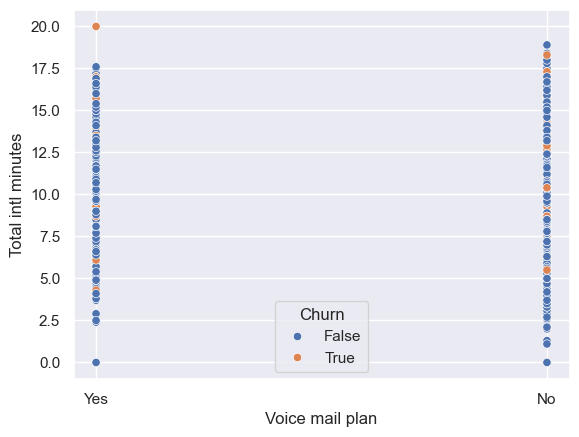

In [157]:
sns.scatterplot(data= df,y = 'Total intl minutes',x = 'Voice mail plan', hue= "Churn")

<Axes: xlabel='International plan', ylabel='Total intl minutes'>

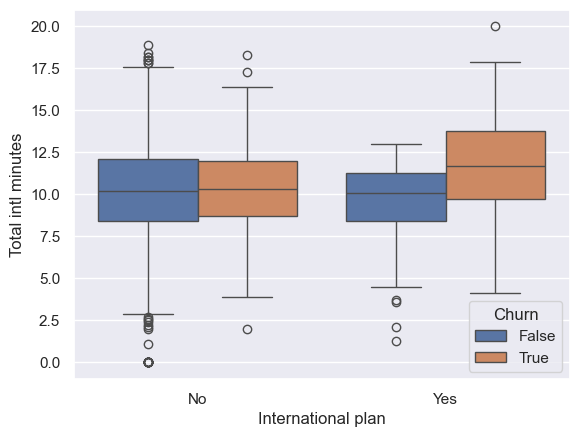

In [158]:
sns.boxplot(data= df,y = 'Total intl minutes' ,x = "International plan", hue= "Churn")

<Axes: xlabel='International plan', ylabel='Total intl minutes'>

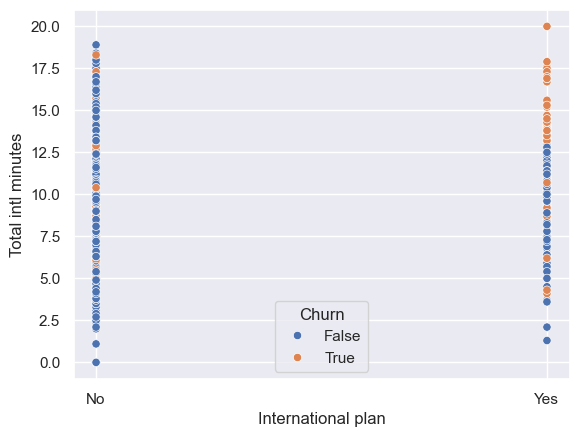

In [159]:
sns.scatterplot(data= df,y = 'Total intl minutes',x = 'International plan', hue= "Churn")

In [160]:
corr_value("Total intl minutes")

The Corelation value with respect to Total intl minutes is: 
Account length            0.009514
Area code                -0.018288
Number vmail messages     0.002856
Total day minutes        -0.010155
Total day calls           0.021565
Total day charge         -0.010157
Total eve minutes        -0.011035
Total eve calls           0.008703
Total eve charge         -0.011043
Total night minutes      -0.015207
Total night calls        -0.013605
Total night charge       -0.015214
Total intl minutes        1.000000
Total intl calls          0.032304
Total intl charge         0.999993
Customer service calls   -0.009640
Churn                     0.068239
Name: Total intl minutes, dtype: float64


In [161]:
cor_min = df['Total intl minutes'].corr(df['Churn'])
cor_charge = df['Total intl charge'].corr(df['Churn'])
print(f"The correlation between Total intl minutes and Churn is {cor_min}")
print(f"The correlation between Total intl Charge and Churn is {cor_charge}")

The correlation between Total intl minutes and Churn is 0.06823877562717728
The correlation between Total intl Charge and Churn is 0.06825863150391497


### Total intl calls
- Not and definite result hence we ignore this column

In [163]:
df["Total intl calls"].describe()

count    3333.000000
mean        4.479448
std         2.461214
min         0.000000
25%         3.000000
50%         4.000000
75%         6.000000
max        20.000000
Name: Total intl calls, dtype: float64

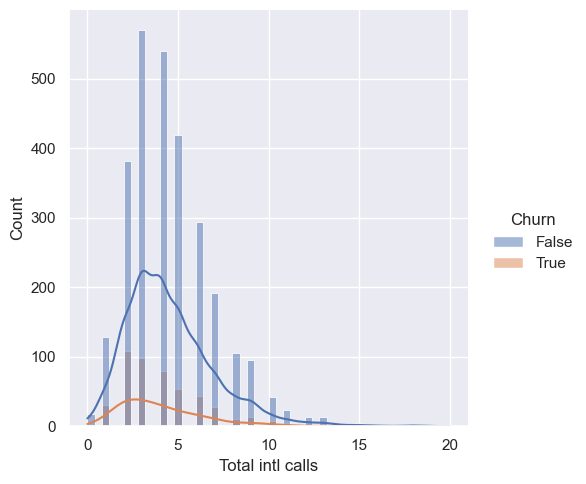

In [164]:
sns.displot(data = df, x = 'Total intl calls',kde=True, hue = "Churn")

In [165]:
 len(df["Total intl calls"].unique())

21

<Axes: xlabel='Total intl calls'>

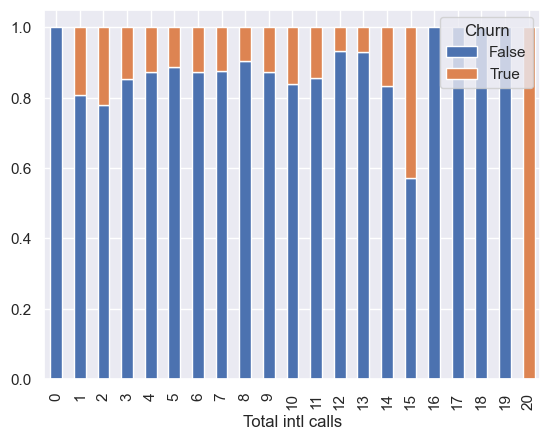

In [166]:
pd.crosstab(df['Total intl calls'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [167]:
# As there are 1442 Unique value create a new colume as per the 50% Quartile Distribution
def transform_intl_calls(num):
    if num <= 4:
        return "Less than 4"
    #elif num >73 and num <= 100:
       # return "Between 73 and 100"
    #elif num >100 and num <= 127:
        #return "Between 100 and 127"
    else:
        return "Greater than 4"

In [168]:
df["Intl calls"] = df["Total intl calls"].apply(transform_intl_calls)

In [169]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Account size,Day calls,Eve minutes,Eve calls,Night minutes,Night calls,Intl calls
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 127,Greater than 101,Less than 200,Less than 100,Greater than 201,Less than 100,Less than 4
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Between 100 and 127,Greater than 101,Less than 200,Greater than 100,Greater than 201,Greater than 100,Less than 4
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 127,Greater than 101,Less than 200,Greater than 100,Less than 201,Greater than 100,Greater than 4
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Between 73 and 100,Less than 101,Less than 200,Less than 100,Less than 201,Less than 100,Greater than 4
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Between 73 and 100,Greater than 101,Less than 200,Greater than 100,Less than 201,Greater than 100,Less than 4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,WI,114,415,No,Yes,26,137.1,88,23.31,155.7,125,13.23,247.6,94,11.14,11.5,7,3.11,2,False,Between 100 and 127,Less than 101,Less than 200,Greater than 100,Greater than 201,Less than 100,Greater than 4
3329,AL,106,408,No,Yes,29,83.6,131,14.21,203.9,131,17.33,229.5,73,10.33,8.1,3,2.19,1,False,Between 100 and 127,Greater than 101,Greater than 200,Greater than 100,Greater than 201,Less than 100,Less than 4
3330,VT,60,415,No,No,0,193.9,118,32.96,85.0,110,7.23,210.1,134,9.45,13.2,8,3.56,3,False,Less than 73,Greater than 101,Less than 200,Greater than 100,Greater than 201,Greater than 100,Greater than 4
3331,WV,159,415,No,No,0,169.8,114,28.87,197.7,105,16.80,193.7,82,8.72,11.6,4,3.13,1,False,Greater than 127,Greater than 101,Less than 200,Greater than 100,Less than 201,Less than 100,Less than 4


<Axes: xlabel='Intl calls'>

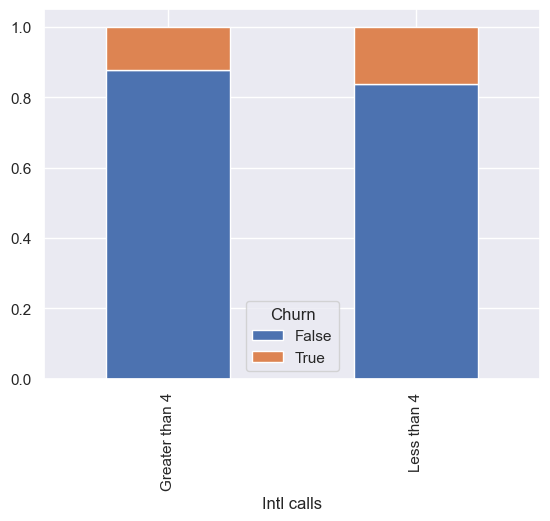

In [170]:
pd.crosstab(df['Intl calls'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

<Axes: xlabel='Intl calls'>

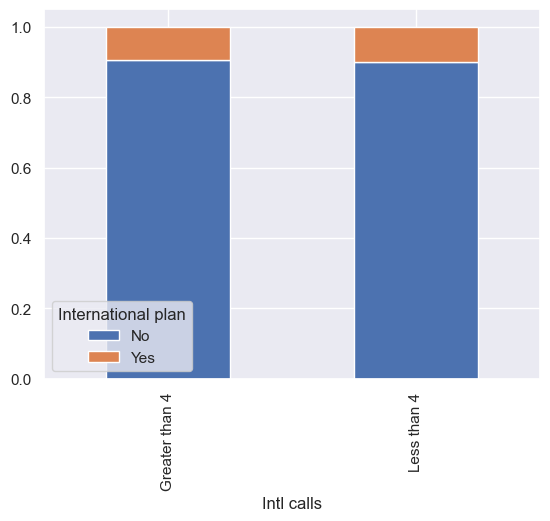

In [171]:
pd.crosstab(df['Intl calls'],df['International plan'],normalize='index').plot(kind='bar',stacked=True)

<Axes: xlabel='International plan', ylabel='Total intl calls'>

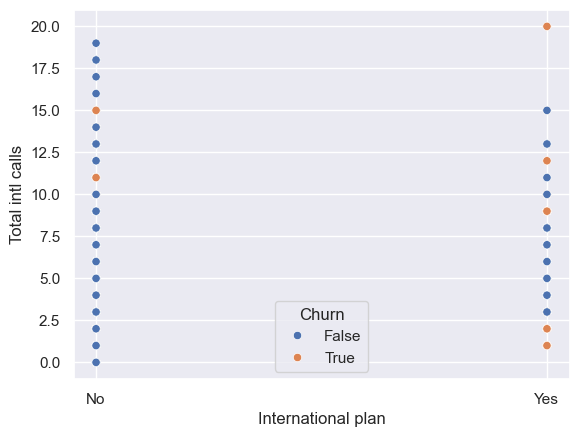

In [172]:
sns.scatterplot(data= df,y = 'Total intl calls',x = 'International plan', hue= "Churn")

<Axes: xlabel='Total intl minutes', ylabel='Total intl calls'>

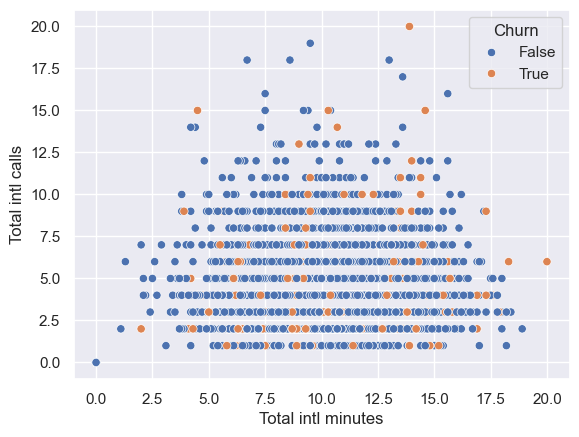

In [173]:
sns.scatterplot(data= df,y = 'Total intl calls',x = 'Total intl minutes', hue= "Churn")

### Customer service call
- With the customer service call more than 4 is more likely to Exit the service

In [175]:
df["Customer service calls"].describe()

count    3333.000000
mean        1.562856
std         1.315491
min         0.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         9.000000
Name: Customer service calls, dtype: float64

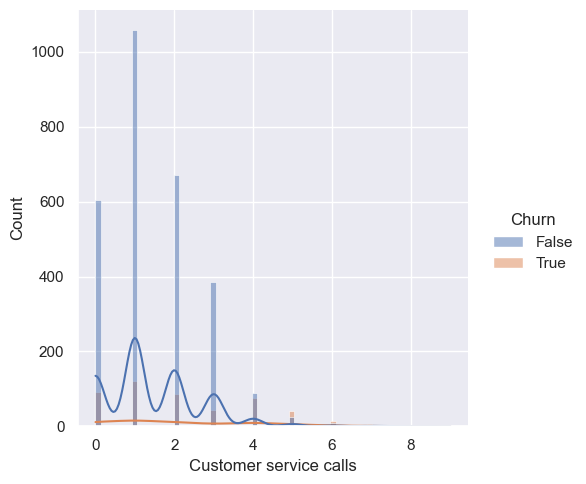

In [176]:
sns.displot(data = df, x = 'Customer service calls',kde=True, hue = "Churn")

<Axes: ylabel='Customer service calls'>

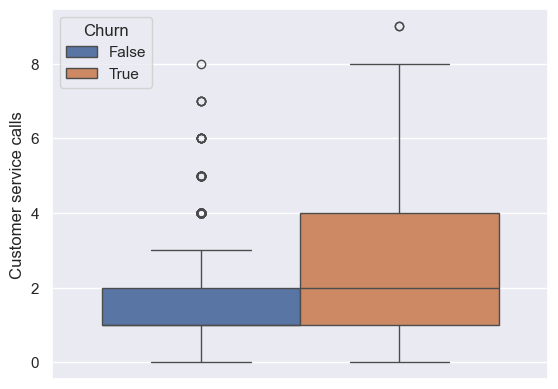

In [177]:
sns.boxplot(data= df,y = 'Customer service calls', hue= "Churn")

<Axes: xlabel='Customer service calls', ylabel='Customer service calls'>

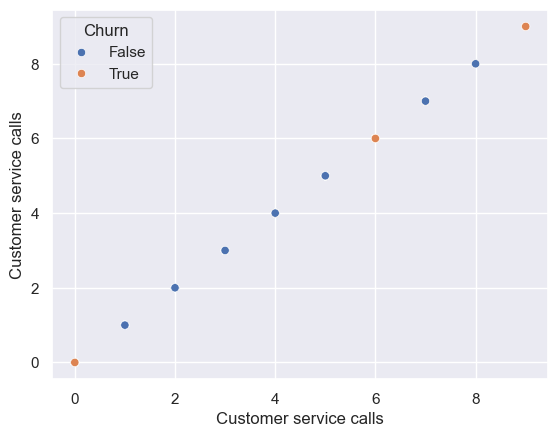

In [178]:
sns.scatterplot(data= df,x = 'Customer service calls',y = 'Customer service calls', hue= "Churn")

<Axes: xlabel='Customer service calls'>

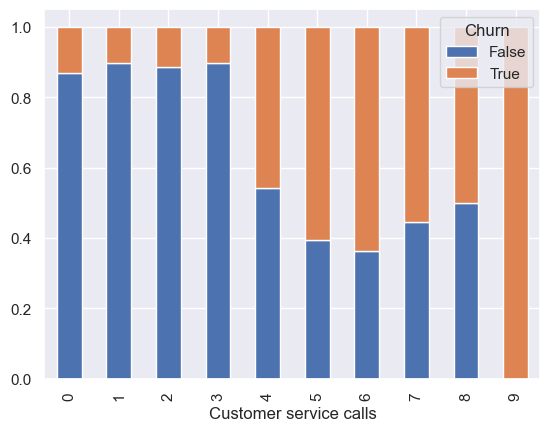

In [179]:
pd.crosstab(df['Customer service calls'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [180]:
# As there are 1442 Unique value create a new colume as per the 50% Quartile Distribution
def transform_cust_calls(num):
    if num <= 4:
        return "Less than 4"
    #elif num >73 and num <= 100:
       # return "Between 73 and 100"
    #elif num >100 and num <= 127:
        #return "Between 100 and 127"
    else:
        return "Greater than 4"

In [181]:
df["Cust calls"] = df["Customer service calls"].apply(transform_cust_calls)

In [182]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Account size,Day calls,Eve minutes,Eve calls,Night minutes,Night calls,Intl calls,Cust calls
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 127,Greater than 101,Less than 200,Less than 100,Greater than 201,Less than 100,Less than 4,Less than 4
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Between 100 and 127,Greater than 101,Less than 200,Greater than 100,Greater than 201,Greater than 100,Less than 4,Less than 4
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 127,Greater than 101,Less than 200,Greater than 100,Less than 201,Greater than 100,Greater than 4,Less than 4
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Between 73 and 100,Less than 101,Less than 200,Less than 100,Less than 201,Less than 100,Greater than 4,Less than 4
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Between 73 and 100,Greater than 101,Less than 200,Greater than 100,Less than 201,Greater than 100,Less than 4,Less than 4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,WI,114,415,No,Yes,26,137.1,88,23.31,155.7,125,13.23,247.6,94,11.14,11.5,7,3.11,2,False,Between 100 and 127,Less than 101,Less than 200,Greater than 100,Greater than 201,Less than 100,Greater than 4,Less than 4
3329,AL,106,408,No,Yes,29,83.6,131,14.21,203.9,131,17.33,229.5,73,10.33,8.1,3,2.19,1,False,Between 100 and 127,Greater than 101,Greater than 200,Greater than 100,Greater than 201,Less than 100,Less than 4,Less than 4
3330,VT,60,415,No,No,0,193.9,118,32.96,85.0,110,7.23,210.1,134,9.45,13.2,8,3.56,3,False,Less than 73,Greater than 101,Less than 200,Greater than 100,Greater than 201,Greater than 100,Greater than 4,Less than 4
3331,WV,159,415,No,No,0,169.8,114,28.87,197.7,105,16.80,193.7,82,8.72,11.6,4,3.13,1,False,Greater than 127,Greater than 101,Less than 200,Greater than 100,Less than 201,Less than 100,Less than 4,Less than 4


<Axes: xlabel='Cust calls'>

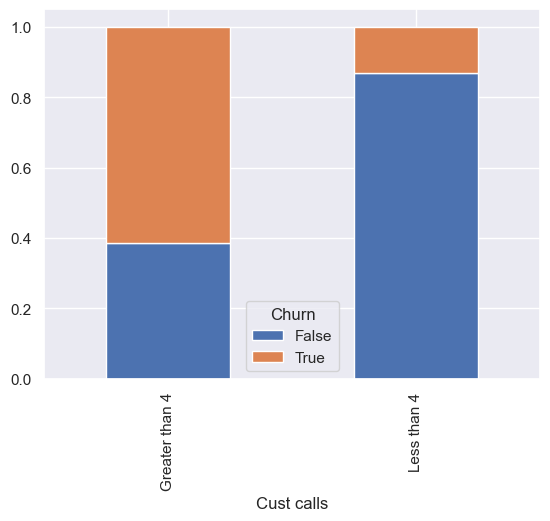

In [183]:
pd.crosstab(df['Cust calls'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

### Encoding
- Now we have completed the EDA part now we are goind to delete the extra feature that has been created during the EDA
- Also drop the feature that we have conclude that it is not required for the Model Training part
- Not we will start the Encoding Part as well

In [185]:
new_df = df.drop(col_to_drop,axis=1)

In [186]:
new_df

,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn
0,No,Yes,25,265.1,197.4,244.7,10.0,1,False
1,No,Yes,26,161.6,195.5,254.4,13.7,1,False
2,No,No,0,243.4,121.2,162.6,12.2,0,False
3,Yes,No,0,299.4,61.9,196.9,6.6,2,False
4,Yes,No,0,166.7,148.3,186.9,10.1,3,False
...,...,...,...,...,...,...,...,...,...
3328,No,Yes,26,137.1,155.7,247.6,11.5,2,False
3329,No,Yes,29,83.6,203.9,229.5,8.1,1,False
3330,No,No,0,193.9,85.0,210.1,13.2,3,False
3331,No,No,0,169.8,197.7,193.7,11.6,1,False


In [187]:
# Importing the library for the One Hot Encoding Part

new_df["Intl plan"] = pd.get_dummies(new_df["International plan"],drop_first=True,dtype=int)
new_df["Vmail plan"] =pd.get_dummies(new_df["Voice mail plan"],drop_first=True,dtype=int)
new_df

,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
0,No,Yes,25,265.1,197.4,244.7,10.0,1,False,0,1
1,No,Yes,26,161.6,195.5,254.4,13.7,1,False,0,1
2,No,No,0,243.4,121.2,162.6,12.2,0,False,0,0
3,Yes,No,0,299.4,61.9,196.9,6.6,2,False,1,0
4,Yes,No,0,166.7,148.3,186.9,10.1,3,False,1,0
...,...,...,...,...,...,...,...,...,...,...,...
3328,No,Yes,26,137.1,155.7,247.6,11.5,2,False,0,1
3329,No,Yes,29,83.6,203.9,229.5,8.1,1,False,0,1
3330,No,No,0,193.9,85.0,210.1,13.2,3,False,0,0
3331,No,No,0,169.8,197.7,193.7,11.6,1,False,0,0


In [188]:
new_df.drop(["International plan","Voice mail plan"],axis=1,inplace=True)
new_df

,Number vmail messages,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
0,25,265.1,197.4,244.7,10.0,1,False,0,1
1,26,161.6,195.5,254.4,13.7,1,False,0,1
2,0,243.4,121.2,162.6,12.2,0,False,0,0
3,0,299.4,61.9,196.9,6.6,2,False,1,0
4,0,166.7,148.3,186.9,10.1,3,False,1,0
...,...,...,...,...,...,...,...,...,...
3328,26,137.1,155.7,247.6,11.5,2,False,0,1
3329,29,83.6,203.9,229.5,8.1,1,False,0,1
3330,0,193.9,85.0,210.1,13.2,3,False,0,0
3331,0,169.8,197.7,193.7,11.6,1,False,0,0


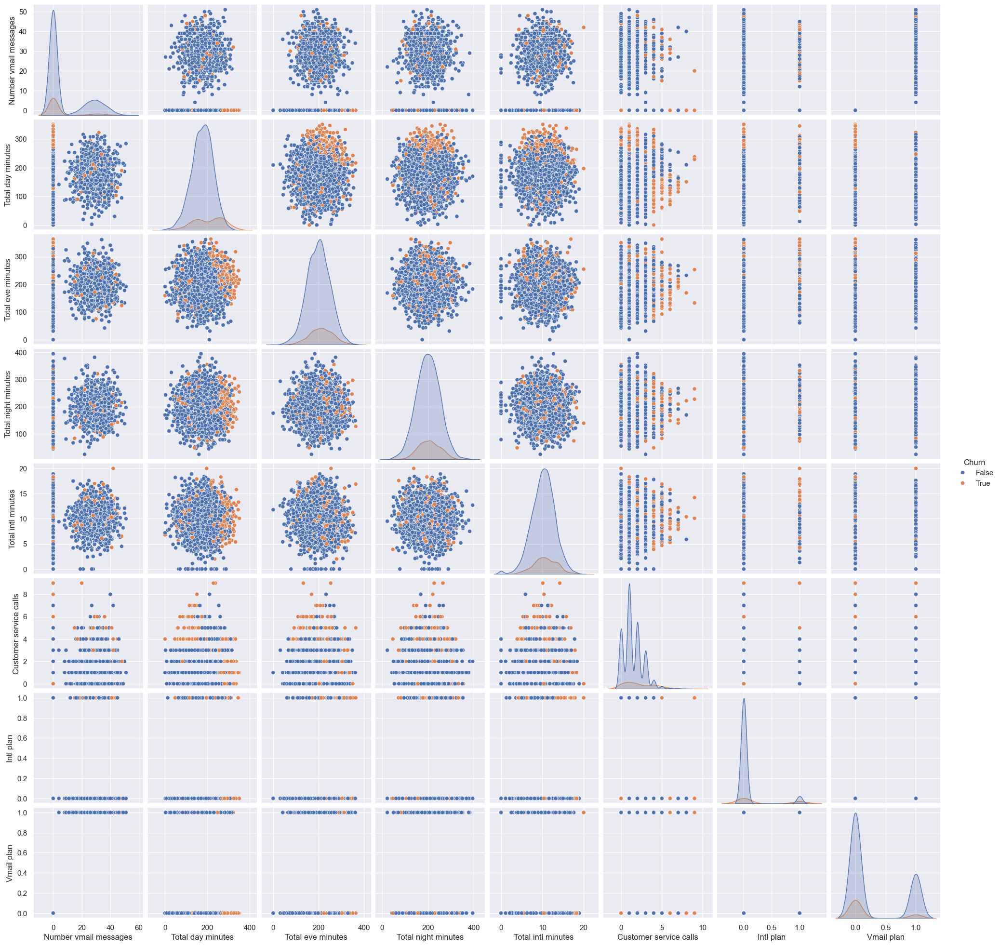

In [189]:
sns.pairplot(new_df,hue='Churn')

In [190]:
new_df.drop(["Number vmail messages"],axis=1,inplace=True)
new_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
0,265.1,197.4,244.7,10.0,1,False,0,1
1,161.6,195.5,254.4,13.7,1,False,0,1
2,243.4,121.2,162.6,12.2,0,False,0,0
3,299.4,61.9,196.9,6.6,2,False,1,0
4,166.7,148.3,186.9,10.1,3,False,1,0
...,...,...,...,...,...,...,...,...
3328,137.1,155.7,247.6,11.5,2,False,0,1
3329,83.6,203.9,229.5,8.1,1,False,0,1
3330,193.9,85.0,210.1,13.2,3,False,0,0
3331,169.8,197.7,193.7,11.6,1,False,0,0


### Outlier Treatment
- Now we try to treat the outlier found in the remaining features
- As Total day minuts , Total eve minutes, Total night minutes, Total intl minutes are Normal Distribution we will treat the outliers using the Z-score
- As Customer service calls are not normal distribution we will leave it as it is or replace the value greater than 4 with 4

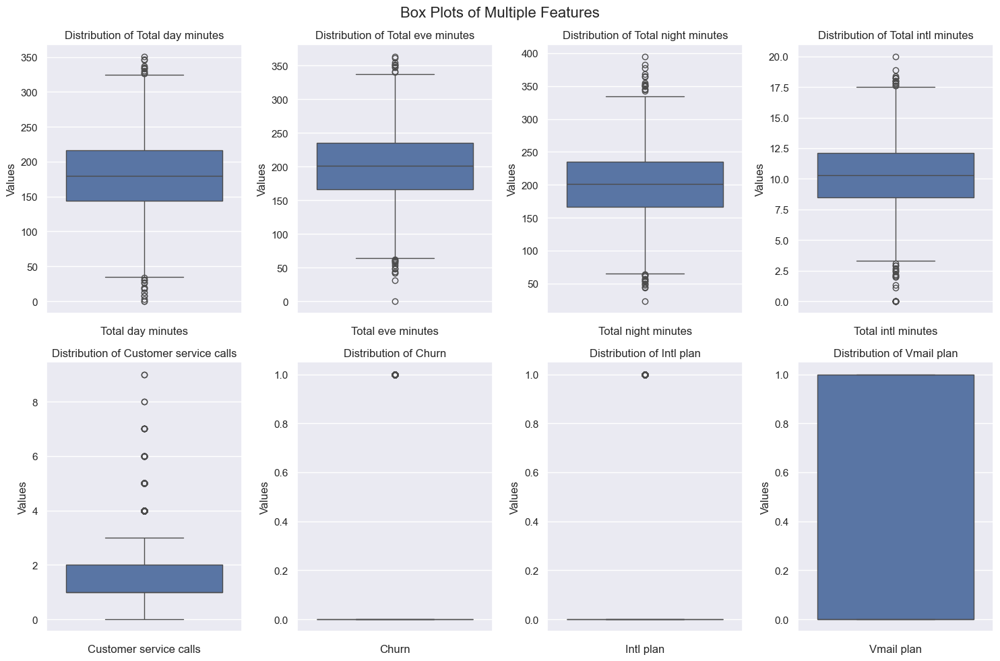

In [192]:
# Set up the plot
fig, axes = plt.subplots(2, 4, figsize=(15, 10))
fig.suptitle('Box Plots of Multiple Features', fontsize=16)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Create a box plot for each feature
for i, column in enumerate(new_df.columns):
    sns.boxplot(data=new_df[column], ax=axes[i])
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel(f'{column}')
    axes[i].set_ylabel('Values')

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

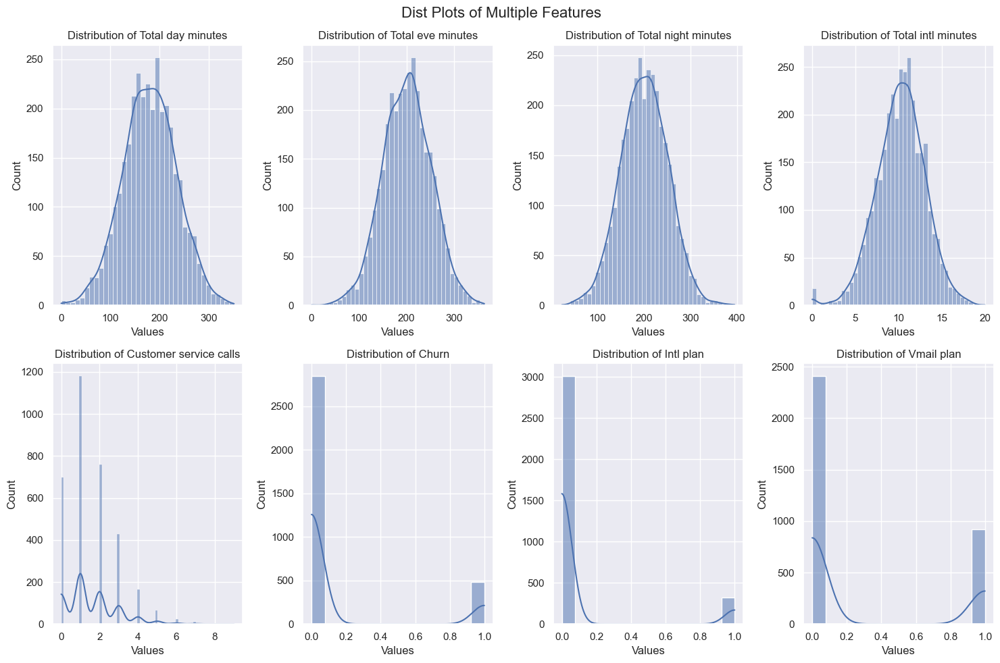

In [193]:
# Set up the plot
fig, axes = plt.subplots(2, 4, figsize=(15, 10))
fig.suptitle('Dist Plots of Multiple Features', fontsize=16)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Create a dist plot for each feature
for i, column in enumerate(new_df.columns):
    sns.histplot(data=new_df, x=column, kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel('Values')
    axes[i].set_ylabel('Count')

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

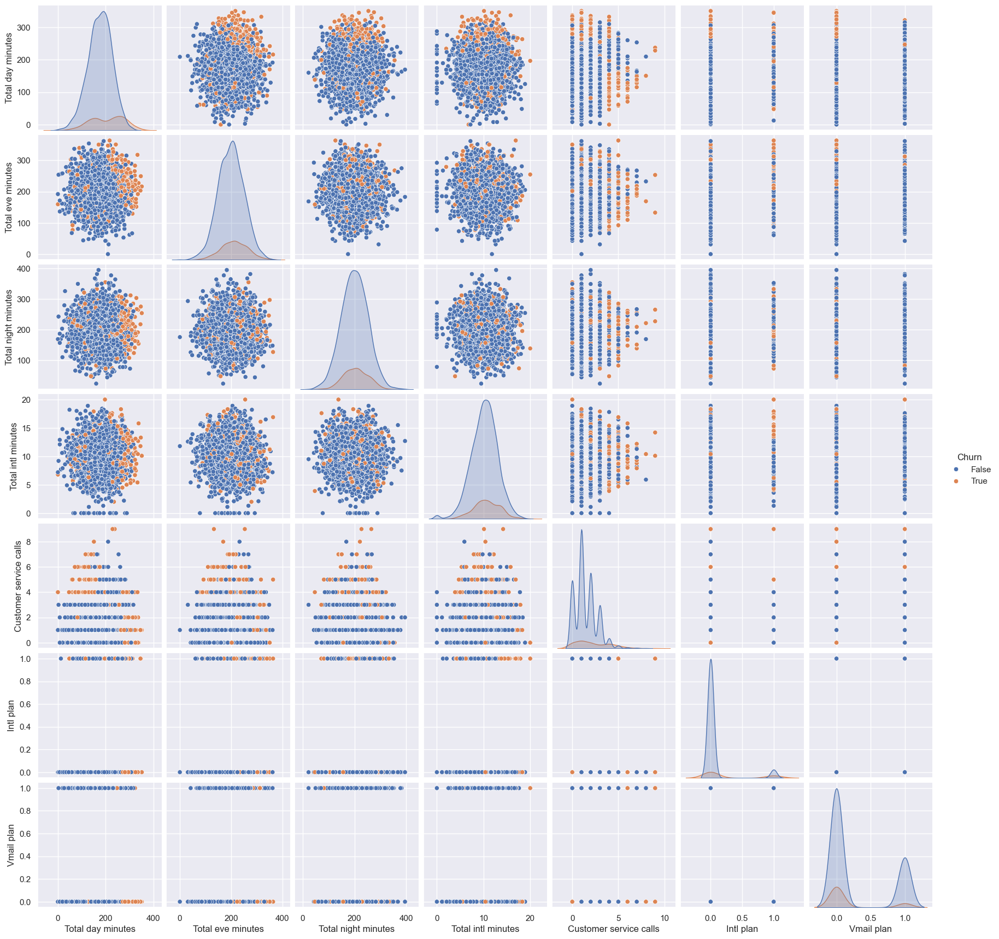

In [194]:
sns.pairplot(new_df,hue='Churn')

In [195]:
#Splitting Dependent (y) and independent (X) variables
X = new_df.drop(["Churn"],axis=1)
y = new_df["Churn"]

In [196]:
X

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Intl plan,Vmail plan
0,265.1,197.4,244.7,10.0,1,0,1
1,161.6,195.5,254.4,13.7,1,0,1
2,243.4,121.2,162.6,12.2,0,0,0
3,299.4,61.9,196.9,6.6,2,1,0
4,166.7,148.3,186.9,10.1,3,1,0
...,...,...,...,...,...,...,...
3328,137.1,155.7,247.6,11.5,2,0,1
3329,83.6,203.9,229.5,8.1,1,0,1
3330,193.9,85.0,210.1,13.2,3,0,0
3331,169.8,197.7,193.7,11.6,1,0,0


In [197]:
y

0       False
1       False
2       False
3       False
4       False
        ...  
3328    False
3329    False
3330    False
3331    False
3332    False
Name: Churn, Length: 3333, dtype: bool

In [198]:
# defining the fucntion to find the upper and lower bound of the data
def upper_lower(col):
    print(X[col].describe())
    upper = X[col].mean() + 3 * X[col].std()
    lower = X[col].mean() - 3 * X[col].std()
    upper_per = X[X[col]>upper].shape[0]/X.shape[0]
    lower_per = X[X[col]<lower].shape[0]/X.shape[0]
    print(f"{col} > {upper} is {upper_per*100:.2f}% and {col} < {lower} is {lower_per*100:.2f}%")
    return upper, lower

In [199]:
# Function to replae the outliers with upper and lower bound
def replace_outlier (col, upper , lower):
    X.loc[new_df[col] > upper, col] = upper
    X.loc[new_df[col] < lower, col] = lower

In [200]:
#Function to print the data with upper and lower bound
def print_df(col,upper,lower):
    u_df = new_df[new_df[col]>upper]
    l_df = new_df[new_df[col]<lower]
    return u_df, l_df

### Feature Total day minutes
- As the Outliers is very minimal so there is not much neccessary to treat the outliers.
- As Treating the upper bound which is 342 is not necessary
- As Terating the lower bound which is 16 might mislead the data who have 0 day minutes

In [202]:
upper, lower = upper_lower("Total day minutes")

count    3333.000000
mean      179.775098
std        54.467389
min         0.000000
25%       143.700000
50%       179.400000
75%       216.400000
max       350.800000
Name: Total day minutes, dtype: float64
Total day minutes > 343.1772651168651 is 0.09% and Total day minutes < 16.372929902636912 is 0.18%


In [203]:
u_df, l_df = print_df("Total day minutes",upper,lower)

In [204]:
u_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
296,350.8,216.5,253.9,10.1,1,True,0,0
780,346.8,249.5,275.4,13.3,1,True,1,0
2087,345.3,203.4,217.5,11.8,1,True,1,0


In [205]:
l_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
833,12.5,256.6,169.4,7.7,1,False,1,0
1057,0.0,159.6,167.1,6.8,4,True,0,0
1100,0.0,192.1,168.8,7.2,1,False,0,0
1575,7.9,136.4,156.6,12.1,0,False,0,0
2206,2.6,254.0,242.7,9.2,3,False,0,1
2218,7.8,171.4,186.5,12.9,2,False,0,0


### Total eve minutes
- As the Outliers is very minimal so there is not much neccessary to treat the outliers.- 
As Treating the upper bound which is 532 is not necessar and only 2 values are there.
- 
As Terating the lower bound which i4716 might mislead the data who have 0 day minutes

In [207]:
upper, lower = upper_lower("Total eve minutes")

count    3333.000000
mean      200.980348
std        50.713844
min         0.000000
25%       166.600000
50%       201.400000
75%       235.300000
max       363.700000
Name: Total eve minutes, dtype: float64
Total eve minutes > 353.12188131223934 is 0.09% and Total eve minutes < 48.83881475736763 is 0.18%


In [208]:
u_df, l_df = print_df("Total eve minutes",upper,lower)

In [209]:
u_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
2054,129.5,354.2,145.5,10.9,1,False,0,0
2202,216.2,363.7,126.7,16.9,5,True,1,0
3119,191.4,361.8,147.5,7.2,1,False,0,1


In [210]:
l_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
27,212.0,31.2,293.3,12.6,3,False,0,0
429,201.3,42.2,125.7,5.4,1,False,0,1
647,105.8,43.9,189.6,13.1,0,False,0,0
704,198.5,42.5,179.2,12.4,0,False,0,0
2358,209.2,0.0,175.4,11.8,1,False,0,0
2929,128.2,48.1,116.3,8.9,0,False,0,0


### Total night minutes
- As the Outliers is very minimal so there is not much neccessary to treat the outliers.
- As Treating the upper bound which is 353 is not necessary and only 6 values are there.
- As Terating the lower bound which is 48 might have only 3 data

In [212]:
upper, lower = upper_lower("Total night minutes")

count    3333.000000
mean      200.872037
std        50.573847
min        23.200000
25%       167.000000
50%       201.200000
75%       235.300000
max       395.000000
Name: Total night minutes, dtype: float64
Total night minutes > 352.5935782446951 is 0.21% and Total night minutes < 49.15049616274561 is 0.12%


In [213]:
u_df, l_df = print_df("Total night minutes",upper,lower)

In [214]:
u_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
201,198.5,267.8,354.9,9.4,0,True,0,0
733,239.9,142.3,364.3,9.3,1,False,0,0
1035,163.5,274.8,381.9,7.5,2,False,0,1
1137,222.5,171.5,377.5,9.7,1,False,0,1
2142,169.8,183.1,395.0,12.7,2,False,0,0
2495,157.6,198.3,364.9,9.1,1,False,0,0
3116,154.6,263.0,367.7,15.5,1,False,0,0


In [215]:
l_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
698,146.3,255.9,45.0,8.0,1,False,0,0
878,206.3,292.8,43.7,10.6,1,False,0,0
2598,138.4,158.9,47.4,3.9,4,True,0,0
2939,160.1,168.7,23.2,9.5,3,False,0,1


### Total intl minutes
- As the Outliers is very minimal so there is not much neccessary to treat the outliers.
- As Treating the upper bound which is 18 is not necessary and only 2 values are there.
- As Terating the lower bound which is 1 might mislead the data who have 0 day minutes

In [217]:
upper, lower = upper_lower("Total intl minutes")

count    3333.000000
mean       10.237294
std         2.791840
min         0.000000
25%         8.500000
50%        10.300000
75%        12.100000
max        20.000000
Name: Total intl minutes, dtype: float64
Total intl minutes > 18.61281237459819 is 0.06% and Total intl minutes < 1.8617750841476806 is 0.60%


In [218]:
u_df, l_df = print_df("Total intl minutes",upper,lower)

In [219]:
u_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
93,196.8,254.9,138.3,20.0,0,True,1,1
251,125.2,205.4,254.4,18.9,0,False,0,0


In [220]:
l_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
145,232.1,292.3,201.2,0.0,3,False,0,0
278,64.6,176.1,244.8,0.0,2,False,0,1
393,242.9,209.8,228.4,0.0,1,False,0,0
477,151.4,152.4,250.1,0.0,1,False,0,1
559,114.4,78.3,232.7,0.0,2,False,0,0
600,189.6,267.4,184.5,1.3,1,False,1,0
694,281.0,160.6,77.9,0.0,1,False,0,0
814,222.8,215.9,223.5,0.0,1,False,0,0
853,191.5,175.2,220.3,0.0,0,False,0,0
1103,132.0,197.5,175.8,0.0,3,False,0,0


### Spliting Train and Test Data

In [222]:
# Importing the library

from sklearn.model_selection import train_test_split

In [491]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [493]:
X_train.shape

(2333, 7)

In [495]:
X_test.shape

(1000, 7)

In [226]:
!pip install --upgrade scikit-learn
!pip install --upgrade imbalanced-learn

In [497]:
from imblearn.over_sampling import SMOTE

In [499]:
smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

In [501]:
X_train.shape

(3986, 7)

In [503]:
X_test.shape

(1000, 7)

<Axes: ylabel='count'>

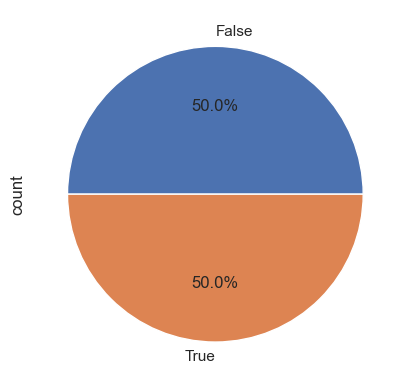

In [505]:
y_train.value_counts().plot(kind='pie',autopct='%0.1f%%')

### Feature Scaling

In [508]:
# Importing the Library

from sklearn.preprocessing import MinMaxScaler,StandardScaler

In [510]:
# We will use the min max scaller that will change the value from 0 to 1 as there are certail minimal Outliers in the data

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### Model Training

In [513]:
# importing all the Algorithm that can be used

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier

### Trying Random Forest Regression

In [535]:
model = RandomForestClassifier()

In [537]:
model.fit(X_train,y_train)

RandomForestClassifier()

In [539]:
model.score(X_test,y_test)

0.912

### Confustion Matix adn Classification Report

In [542]:
from sklearn.metrics import confusion_matrix,classification_report

In [544]:
y_pred = model.predict(X_test)

In [546]:
cm = confusion_matrix(y_test,y_pred)
print(cm)

[[810  47]
 [ 41 102]]


Text(92.25, 0.5, 'Truth')

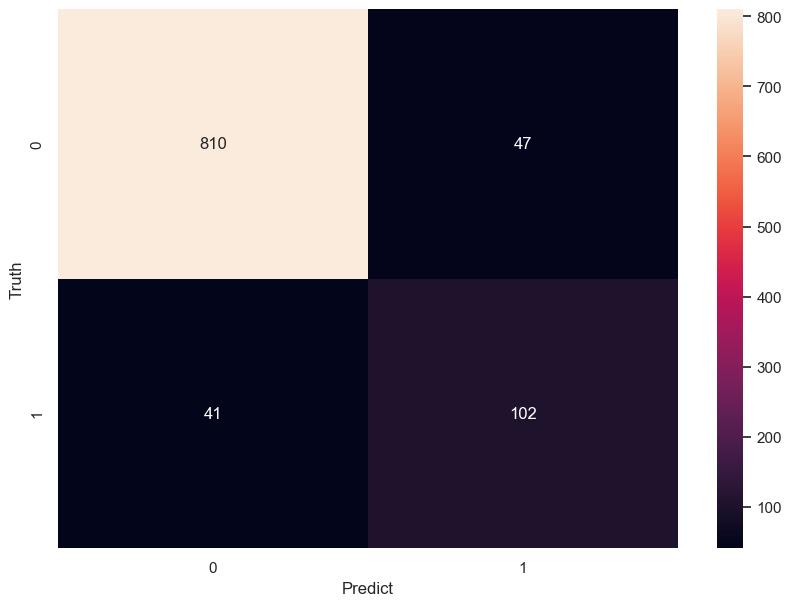

In [548]:
plt.figure(figsize=(10,7))
sns.heatmap(cm,annot=True,fmt="d")
plt.xlabel("Predict")
plt.ylabel("Truth")

In [550]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

       False       0.95      0.95      0.95       857
        True       0.68      0.71      0.70       143

    accuracy                           0.91      1000
   macro avg       0.82      0.83      0.82      1000
weighted avg       0.91      0.91      0.91      1000



### Hyper parameter tuning

In [553]:
# Finding the Best model out of all the selected model using the loop and dictionary and Grid Search CV

In [555]:
# Creating a dictionary
model_params = {
    "logistic_regression":{
        "model":LogisticRegression(),
        "params":{
            "C":[1,5,10,100],
            "max_iter":[100,150,200]
        }
    },
    "naive_bayes":{
        "model":BernoulliNB(),
        "params":{
            "alpha":[0.1,0.5,0.9,1.0,1.5],
            "fit_prior":[True,False]
        }
    },
    "KNN":{
        "model":KNeighborsClassifier(),
        "params":{
            "n_neighbors":[3,5,7,9,11,13],
            "weights":["uniform",'distance'],
            "p":[1,2]
        }
    },
    "SVM":{
        "model":SVC(),
        "params":{
            'C':[0.25,0.4,0.5,0.6,0.7,0.8,0.9,1],
            'gamma':[0.5,0.6,0.7,0.8,0.9,1.0],
            'kernel':['rbf','linear']
        }
    },
    "Decision_Tree":{
        "model":DecisionTreeClassifier(),
        "params":{
            "max_depth": [None, 10, 20],
            "min_samples_split": [2, 5, 10],
            "min_samples_leaf": [1, 2, 4],
            "max_features": [None, "sqrt", "log2"],
            "max_leaf_nodes": [None, 10, 20, 30],
        }
    },
    "Random_Forest":{
        "model":RandomForestClassifier(),
        "params":{
            "n_estimators": [100, 200, 300, 400, 500],
            "max_depth": [None, 10, 20,50],
            "min_samples_split": [2, 5, 10],
            "min_samples_leaf": [1, 2, 4],
        }
    },
    "AdaBoost":{
        "model":AdaBoostClassifier(),
        "params":{
            "n_estimators": [100, 200, 300, 400, 500],
            "learning_rate": [0.01, 0.1, 0.5, 1.0, 1.5],
            'algorithm' : ['SAMME']
        
        }
    }
}

In [557]:
# Improting Library

from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [559]:
# Looping Through all the models and prameters for hyper parameter tuning

scores = []

for model_name, mp in model_params.items():
    clf = RandomizedSearchCV(mp["model"],mp["params"], cv = 5, return_train_score= False)
    clf.fit(X_train,y_train)
    scores.append({
        "model" : model_name,
        "best_score" : clf.best_score_,
        "best_params": clf.best_params_
    })

In [560]:
best_params_df = pd.DataFrame(scores,columns=["model","best_score","best_params"])
best_params_df

,model,best_score,best_params
0,logistic_regression,0.727057,"{'max_iter': 100, 'C': 1}"
1,naive_bayes,0.617922,"{'fit_prior': True, 'alpha': 0.1}"
2,KNN,0.865285,"{'weights': 'distance', 'p': 1, 'n_neighbors': 9}"
3,SVM,0.783244,"{'kernel': 'rbf', 'gamma': 0.9, 'C': 0.6}"
4,Decision_Tree,0.818873,"{'min_samples_split': 10, 'min_samples_leaf': ..."
5,Random_Forest,0.899400,"{'n_estimators': 200, 'min_samples_split': 2, ..."
6,AdaBoost,0.775466,"{'n_estimators': 400, 'learning_rate': 1.5, 'a..."


### Choosing the Best Parameters

In [254]:
scores

[{'model': 'logistic_regression',
  'best_score': 0.7270569774498983,
  'best_params': {'max_iter': 200, 'C': 1}},
 {'model': 'naive_bayes',
  'best_score': 0.617921843504621,
  'best_params': {'fit_prior': True, 'alpha': 0.1}},
 {'model': 'KNN',
  'best_score': 0.8637783291352598,
  'best_params': {'weights': 'distance', 'p': 1, 'n_neighbors': 11}},
 {'model': 'SVM',
  'best_score': 0.782992298814791,
  'best_params': {'kernel': 'rbf', 'gamma': 0.8, 'C': 0.8}},
 {'model': 'Decision_Tree',
  'best_score': 0.8484787879359628,
  'best_params': {'min_samples_split': 2,
   'min_samples_leaf': 2,
   'max_leaf_nodes': None,
   'max_features': None,
   'max_depth': 20}},
 {'model': 'Random_Forest',
  'best_score': 0.8958880891060776,
  'best_params': {'n_estimators': 100,
   'min_samples_split': 2,
   'min_samples_leaf': 1,
   'max_depth': 20}},
 {'model': 'AdaBoost',
  'best_score': 0.7749650160533077,
  'best_params': {'n_estimators': 500,
   'learning_rate': 1.5,
   'algorithm': 'SAMME'}}]

In [563]:
model = RandomForestClassifier(n_estimators=100,min_samples_split=2,min_samples_leaf=1,max_depth=20)

In [565]:
model.fit(X_train,y_train)

RandomForestClassifier(max_depth=20)

In [567]:
model.score(X_test,y_test)

0.91

In [569]:
y_pred = model.predict(X_test)

In [571]:
cm = confusion_matrix(y_test,y_pred)
print(cm)

[[809  48]
 [ 42 101]]


Text(92.25, 0.5, 'Truth')

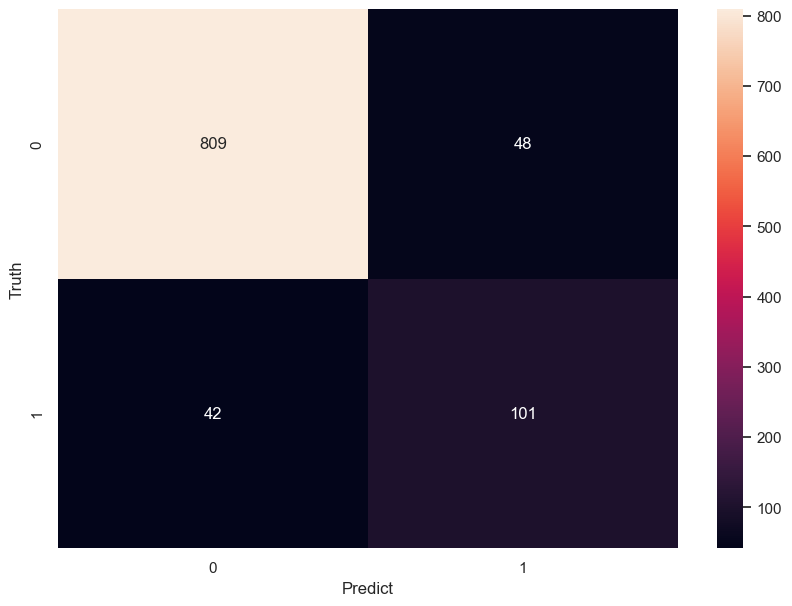

In [573]:
plt.figure(figsize=(10,7))
sns.heatmap(cm,annot=True,fmt="d")
plt.xlabel("Predict")
plt.ylabel("Truth")

In [575]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

       False       0.95      0.94      0.95       857
        True       0.68      0.71      0.69       143

    accuracy                           0.91      1000
   macro avg       0.81      0.83      0.82      1000
weighted avg       0.91      0.91      0.91      1000



### Conclusion
- Still The F1 Score for the True Case was not improved so much.
- It is due to imbalanced dataset as there was less number of True case to Train the model